In [1]:
# DEFINES
import pandas as pd
import pandas_profiling 
import numpy as np
from sklearn import datasets, svm, metrics
import seaborn as sns
import statistics

import warnings
warnings.filterwarnings('ignore')

import matplotlib.pyplot as plt
%matplotlib inline
plt.rcParams["figure.figsize"] = [12, 8]

In [2]:
fileUrl_ru = 'russian_universities_with_rating_and_manual.csv'
df_ru = pd.read_csv(fileUrl_ru, sep=',')
df_ru.head(3)

,title,custom__category,base_url,custom__name_en,custom__unirank,custom__forbes_rank,custom__raex_rank,custom__qs_rank,custom__the_rank,custom__city,custom__region,page__1,page__2,page__3,site_error,vi_not_work,vi_found,vi_m_f,vi_b_f,vi_is_panel,vi_is_apply_changes,vi_is_reload,vi_is_cross_pages,vi_font_sizes,vi_color_schemes,vi_pictures_modes,vi_font_sizes_wc,vi_color_schemes_wc,vi_pictures_switch_wc,vi_line_spacing,vi_letter_spacing,vi_scroll,vi_scale_br,vi_another_content,vi_fonts_switch,site_engine,vi_source,site_lang,site_front,site_crm
0,Адыгейский государственный университет,общий,https://www.adygnet.ru/,Adyghe State University,274.0,NaN,NaN,NaN,NaN,Майкоп,1,https://www.adygnet.ru/,https://www.adygnet.ru/applicants/priemnaya-ka...,https://www.adygnet.ru/zhizn-v-agu/kampus/tsen...,NaN,NaN,1.0,1.0,0.0,1.0,1.0,0.0,1.0,3.0,3.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,1c-bitrix,bitrix special-aaVersion,php,NaN,NaN
1,Алтайский Государственный Технический Универси...,общий технический,https://www.altstu.ru/,Polzunov Altai State Technical University,131.0,NaN,100.0,NaN,NaN,Барнаул,22,https://www.altstu.ru/,https://pk.altstu.ru/,https://www.altstu.ru/structure/unit/ckmr/,NaN,NaN,1.0,1.0,1.0,1.0,1.0,0.0,1.0,3.0,2.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Алтайский государственный университет,общий,https://www.asu.ru/,Altai State University,26.0,59.0,49.0,18.0,NaN,Барнаул,22,https://www.asu.ru/,https://abiturient.asu.ru/,https://www.asu.ru/university_life/culture/life/,NaN,NaN,1.0,1.0,1.0,1.0,1.0,1.0,1.0,3.0,3.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [3]:
df_ru.shape[0]

571

In [4]:
for col in ['site_engine', 'vi_source', 'site_lang', 'site_front', 'site_crm']:
  if col == 'site_engine':
    for idx, row in df_ru.iterrows():
      if pd.isna(row[col]) and row['site_lang'] == 'asp.net':
        df_ru.loc[idx, col] = 'asp.net'
      if row[col] == 'dnn':
        df_ru.loc[idx, col] = 'dnn (asp.net)'
  if col == 'site_lang':
    for idx, row in df_ru.iterrows():
      if row[col] == 'asp.net':
        df_ru.loc[idx, col] = 'asp.net (C#)'
  df_ru[col].fillna('не определено', inplace=True)

for col in ['site_error', 'vi_not_work', 'vi_found', 'vi_m_f', 'vi_b_f', 'vi_is_panel', 'vi_is_apply_changes', 'vi_is_reload', 'vi_is_cross_pages', 'vi_font_sizes', 'vi_color_schemes', 'vi_pictures_modes', 'vi_font_sizes_wc', 'vi_color_schemes_wc', 'vi_pictures_switch_wc', 
            'vi_line_spacing', 'vi_letter_spacing', 'vi_scroll', 'vi_scale_br', 'vi_another_content', 'vi_fonts_switch']:
  df_ru[col].fillna(0, inplace=True)

In [5]:
print(df_ru['site_engine'].value_counts())

1c-bitrix               182
не определено           150
joomla                   72
wordpress                52
drupal                   40
asp.net                  16
typo3                     6
laravel                   6
umi.cms                   6
yii                       5
modx                      4
dnn (asp.net)             4
django cms                3
ruby on rails             3
dle                       3
codeigniter               2
orchard cms               2
opencms                   2
plone cms                 1
siteedit                  1
bolt cms                  1
symfony                   1
django                    1
mediawiki                 1
liferay                   1
wagtail cms (django)      1
odoo                      1
livestreet                1
tilda                     1
next.js                   1
kohana                    1
Name: site_engine, dtype: int64


In [6]:
df_ru['custom__category'] = df_ru['custom__category'].apply(lambda x: x.strip())

In [7]:
def checkEngine(x):
  if x in ['1c-bitrix', 'joomla', 'wordpress', 'drupal', 'laravel', 'typo3', 'umi.cms', 'yii', 'dnn (asp.net)', 'asp.net', 'не определено']:
    return x
  else:
    return 'другое'  
df_ru['site_engine'] = df_ru['site_engine'].apply(checkEngine)

def checkSource(x):
  if x in ['joomla template Accessibility', 'div=access']:
    return 'div class=access'
  else:
    return x
df_ru['vi_source'] = df_ru['vi_source'].apply(checkSource)

print(df_ru['site_engine'].value_counts())
print("*"*25)
print(df_ru['vi_source'].value_counts())
print("*"*25)
print(df_ru['site_lang'].value_counts())
print("*"*25)
print(df_ru['site_front'].value_counts())
print("*"*25)
print(df_ru['site_crm'].value_counts())
print("*"*25)
print(df_ru['custom__category'].value_counts())
print("*"*25)

1c-bitrix        182
не определено    150
joomla            72
wordpress         52
drupal            40
другое            32
asp.net           16
typo3              6
laravel            6
umi.cms            6
yii                5
dnn (asp.net)      4
Name: site_engine, dtype: int64
*************************
не определено                 350
isvek.ru (bvi)                 70
bitrix special-aaVersion       41
div class=access               33
slabovid.ru (mibok)            27
finevision.ru                  12
lidrekon.ru                    11
Comfortable Reading Plugin      8
prolexgroup.ru/special          8
vi-panel                        5
userway.org                     4
pojo.me                         1
b-accessibility                 1
Name: vi_source, dtype: int64
*************************
php              482
не определено     48
asp.net (C#)      22
java               8
python             7
ruby               3
node.js            1
Name: site_lang, dtype: int64
***************

найдено js фреймворков - 33 - 5.8% сайтов

In [8]:
df_tmp = df_ru[df_ru.site_error == 0]['vi_source'].value_counts().to_frame()
sum = df_tmp['vi_source'].sum()
print(sum)
for idx, row in df_tmp.iterrows():
  df_tmp.at[idx, 'vi_source_pct'] = round(int(row['vi_source']) * 100 / sum, 2)
display(df_tmp)

564


,vi_source,vi_source_pct
не определено,343,60.82
isvek.ru (bvi),70,12.41
bitrix special-aaVersion,41,7.27
div class=access,33,5.85
slabovid.ru (mibok),27,4.79
finevision.ru,12,2.13
lidrekon.ru,11,1.95
Comfortable Reading Plugin,8,1.42
prolexgroup.ru/special,8,1.42
vi-panel,5,0.89


In [ ]:
cmap=plt.get_cmap('Pastel1')
print(cmap.colors)

((0.984313725490196, 0.7058823529411765, 0.6823529411764706), (0.7019607843137254, 0.803921568627451, 0.8901960784313725), (0.8, 0.9215686274509803, 0.7725490196078432), (0.8705882352941177, 0.796078431372549, 0.8941176470588236), (0.996078431372549, 0.8509803921568627, 0.6509803921568628), (1.0, 1.0, 0.8), (0.8980392156862745, 0.8470588235294118, 0.7411764705882353), (0.9921568627450981, 0.8549019607843137, 0.9254901960784314), (0.9490196078431372, 0.9490196078431372, 0.9490196078431372))


([<matplotlib.patches.Wedge at 0x7f019dd49e10>,
 [Text(-0.4714062583478313, 2.1489011470029276, '1c-bitrix'),
  Text(-1.9596645587292998, -0.9998573984625501, 'не определено'),
  Text(0.26864633363175755, -2.1835359276701207, 'joomla'),
  Text(1.5853008720810657, -1.5253921282670275, 'wordpress'),
  Text(2.126077447034796, -0.5655039250173305, 'drupal'),
  Text(2.1796343281636257, 0.2986539728359558, 'другое'),
  Text(2.0261078560706083, 0.8572554785878961, 'asp.net'),
  Text(2.1679235408906226, 1.2450331404634438, 'laravel'),
  Text(2.2475438976564766, 1.4961772716182844, 'typo3'),
  Text(2.302746949317321, 1.7627695502843732, 'umi.cms'),
  Text(2.343077746753636, 2.0297750300631607, 'yii'),
  Text(2.3842372462672294, 2.281537366231826, 'dnn (asp.net)')],
 [Text(-0.3642684723596878, 1.6605145226840805, '31.9%'),
  Text(-1.5142862499271863, -0.7726170806301523, '26.3%'),
  Text(0.207590348715449, -1.687277762290548, '12.6%'),
  Text(1.225005219335369, -1.1787120991154305, '9.1%'),
  Te

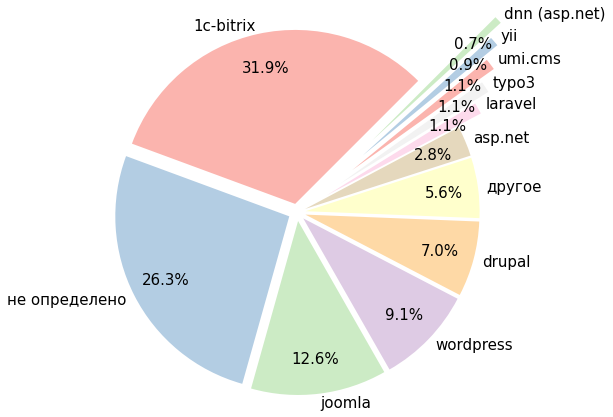

In [ ]:
# df_ru['site_engine'].value_counts().plot(kind='pie', figsize=(8,8), label="", subplots=True)

plt.pie(df_ru['site_engine'].value_counts(), labels=df_ru['site_engine'].value_counts().index.values, autopct='%1.1f%%', shadow=False, radius = 2, startangle = 45, explode = (0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.4, 0.6, 0.8, 1, 1.2), textprops = {"fontsize":15}, pctdistance = 0.8, labeldistance = 1.05, colors=cmap.colors) 

In [ ]:
import plotly
import plotly.graph_objs as go
import plotly.express as px
from plotly.subplots import make_subplots

fig = go.Figure()
fig.add_trace(go.Pie(values=df_ru['site_engine'].value_counts(), labels=df_ru['site_engine'].value_counts().index, sort = True))
fig.show()

([<matplotlib.patches.Wedge at 0x7fc4204f0cd0>,
 [Text(-2.104498641298553, -0.6411594721849981, 'php'),
  Text(2.194589208441983, 0.15420183588398978, 'не определено'),
  Text(2.15552767828615, 1.055320059575444, 'asp.net (C#)'),
  Text(2.1155692991929183, 1.5114121014178714, 'java'),
  Text(2.136373610151419, 1.8099469047042773, 'python'),
  Text(2.1788672460130947, 2.062168161002228, 'ruby'),
  Text(2.275157114360955, 2.2502577863375413, 'node.js')],
 [Text(-1.6262034955488818, -0.4954414103247713, '84.4%'),
  Text(1.6958189337960776, 0.11915596409217391, '8.4%'),
  Text(1.7064594119765357, 0.8354617138305598, '3.9%'),
  Text(1.7087290493481264, 1.2207559280682807, '1.4%'),
  Text(1.7548783226243798, 1.4867421002927992, '1.2%'),
  Text(1.8157227050109124, 1.7184734675018571, '0.5%'),
  Text(1.919663815242056, 1.8986550072223007, '0.2%')])

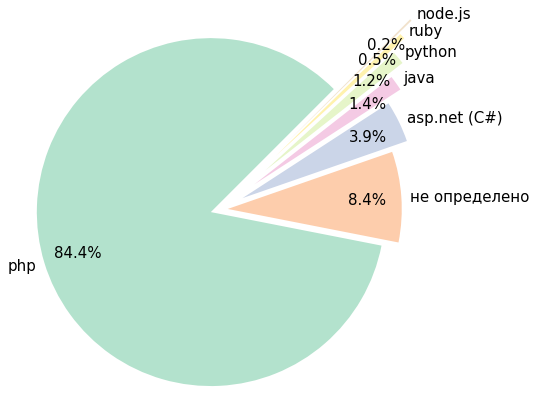

In [ ]:
plt.pie(df_ru['site_lang'].value_counts(), labels=df_ru['site_lang'].value_counts().index.values, autopct='%1.1f%%', shadow=False, radius = 2, startangle = 45, explode = (0.1, 0.1, 0.3, 0.5, 0.7, 0.9, 1.1), textprops = {"fontsize":15}, pctdistance = 0.8, labeldistance = 1.05, colors=plt.get_cmap('Pastel2').colors) 

In [ ]:
fig = go.Figure()
fig.add_trace(go.Pie(values=df_ru['site_lang'].value_counts(), labels=df_ru['site_lang'].value_counts().index, sort = True))
fig.show()

In [9]:
for idx, row in df_ru.iterrows():
  evaluationPoints = 0
  if row['vi_not_work'] == 0:
    evaluationPoints += 10
  if row['vi_not_work'] == 0 and row['vi_found'] == 1 and row['vi_m_f'] == 1:  
    evaluationPoints += 5
  if row['vi_b_f'] == 1:
    evaluationPoints += 4
  if row['vi_scroll'] == 0:
    evaluationPoints += 7
  if row['vi_scale_br'] == 0:
    evaluationPoints += 7

  if row['vi_is_cross_pages'] == 1:
    evaluationPoints += 4
  if row['vi_another_content'] == 0:
    evaluationPoints += 5

  if row['vi_is_panel'] == 1 and row['vi_font_sizes'] > 0 and row['vi_font_sizes_wc'] == 0:
    evaluationPoints -= 3
  if row['vi_is_panel'] == 1 and row['vi_font_sizes'] > 9 and row['vi_font_sizes_wc'] == 1:
    evaluationPoints -= 3
  if row['vi_is_panel'] == 1 and row['vi_color_schemes'] > 0 and row['vi_color_schemes_wc'] == 0:
    evaluationPoints -= 3
  if row['vi_is_panel'] == 1 and row['vi_pictures_modes'] > 0 and row['vi_pictures_switch_wc'] == 0:
    evaluationPoints -= 3
  if row['vi_line_spacing'] == 1:
    evaluationPoints += 2
  if row['vi_letter_spacing'] == 1:
    evaluationPoints += 2
  if row['vi_fonts_switch'] > 0:
    evaluationPoints += 2

  if row['vi_is_panel'] == 1 and row['vi_is_reload'] == 1:
    evaluationPoints -= 1
  if row['vi_is_apply_changes'] == 1:
    evaluationPoints += 1
  df_ru.loc[idx, 'vi_eval'] = evaluationPoints

df_ru.head()  

,title,custom__category,base_url,custom__name_en,custom__unirank,custom__forbes_rank,custom__raex_rank,custom__qs_rank,custom__the_rank,custom__city,custom__region,page__1,page__2,page__3,site_error,vi_not_work,vi_found,vi_m_f,vi_b_f,vi_is_panel,vi_is_apply_changes,vi_is_reload,vi_is_cross_pages,vi_font_sizes,vi_color_schemes,vi_pictures_modes,vi_font_sizes_wc,vi_color_schemes_wc,vi_pictures_switch_wc,vi_line_spacing,vi_letter_spacing,vi_scroll,vi_scale_br,vi_another_content,vi_fonts_switch,site_engine,vi_source,site_lang,site_front,site_crm,vi_eval
0,Адыгейский государственный университет,общий,https://www.adygnet.ru/,Adyghe State University,274.0,NaN,NaN,NaN,NaN,Майкоп,1,https://www.adygnet.ru/,https://www.adygnet.ru/applicants/priemnaya-ka...,https://www.adygnet.ru/zhizn-v-agu/kampus/tsen...,0.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,3.0,3.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1c-bitrix,bitrix special-aaVersion,php,не определено,не определено,30.0
1,Алтайский Государственный Технический Универси...,общий технический,https://www.altstu.ru/,Polzunov Altai State Technical University,131.0,NaN,100.0,NaN,NaN,Барнаул,22,https://www.altstu.ru/,https://pk.altstu.ru/,https://www.altstu.ru/structure/unit/ckmr/,0.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,3.0,2.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,не определено,не определено,не определено,не определено,не определено,36.0
2,Алтайский государственный университет,общий,https://www.asu.ru/,Altai State University,26.0,59.0,49.0,18.0,NaN,Барнаул,22,https://www.asu.ru/,https://abiturient.asu.ru/,https://www.asu.ru/university_life/culture/life/,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,3.0,3.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,не определено,не определено,не определено,не определено,не определено,35.0
3,Ангарский государственный технический университет,общий,http://angtu.ru/,NaN,NaN,NaN,NaN,NaN,NaN,Ангарск,38,http://angtu.ru/,http://angtu.ru/applicants/the_admissions_comm...,http://angtu.ru/universitet/departments/,0.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,3.0,3.0,2.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1c-bitrix,bitrix special-aaVersion,php,preact,не определено,33.0
4,Армавирский государственный педагогический инс...,гуманитарный,http://www.agpu.net/,NaN,NaN,NaN,NaN,NaN,NaN,Армавир,23,http://www.agpu.net/,http://priem.agpu.net/,http://www.agpu.net/studgorodok/ckmr/Default.aspx,0.0,0.0,1.0,0.0,1.0,1.0,1.0,0.0,1.0,5.0,3.0,2.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,2.0,1c-bitrix,lidrekon.ru,php,не определено,не определено,41.0


In [ ]:
print("Среднее кол-во размеров шрифта, если есть переключатели: {0}".format(df_ru[df_ru.vi_font_sizes > 0]['vi_font_sizes'].mean()))
print("Среднее кол-во заданных размеров шрифта (без кнопок больше меньше), если есть переключатели: {0}".format(df_ru[(df_ru.vi_font_sizes > 0) & (df_ru.vi_font_sizes < 10)]['vi_font_sizes'].mean()))
print("Среднее кол-во цветовых схем, если есть переключатели: {0}".format(df_ru[df_ru.vi_color_schemes > 0]['vi_color_schemes'].mean()))
print("Среднее кол-во режимов изображений (например - показаны, откл, откл. только в новостях, черно белые), если есть переключатели: {0}".format(df_ru[df_ru.vi_pictures_modes > 0]['vi_pictures_modes'].mean()))
print("Среднее кол-во гарнитур, если есть переключатели: {0}".format(df_ru[df_ru.vi_fonts_switch > 0]['vi_fonts_switch'].mean()))

Среднее кол-во размеров шрифта, если есть переключатели: 4.738839285714286
Среднее кол-во заданных размеров шрифта (без кнопок больше меньше), если есть переключатели: 3.1507246376811593
Среднее кол-во цветовых схем, если есть переключатели: 3.8364928909952605
Среднее кол-во режимов изображений (например - показаны, откл, откл. только в новостях, черно белые), если есть переключатели: 2.386996904024768
Среднее кол-во гарнитур, если есть переключатели: 2.076923076923077


In [ ]:
for col in ['site_error', 'vi_not_work', 'vi_scroll', 'vi_scale_br']:
  df_tmp_stat = df_ru.groupby([col])[col].agg(['count'])
  df_tmp_stat['pct'] = round(df_tmp_stat['count'] * 100 / df_ru.shape[0], 2)
  display(df_tmp_stat)
  print("*"*40)

,count,pct
site_error,,
0.0,564,98.77
1.0,7,1.23


****************************************


,count,pct
vi_not_work,,
0.0,525,91.94
1.0,46,8.06


****************************************


,count,pct
vi_scroll,,
0.0,347,60.77
1.0,224,39.23


****************************************


,count,pct
vi_scale_br,,
0.0,399,69.88
1.0,172,30.12


****************************************


In [ ]:
df_ru[df_ru.vi_found == 0]

,title,custom__category,base_url,custom__name_en,custom__unirank,custom__forbes_rank,custom__raex_rank,custom__qs_rank,custom__the_rank,custom__city,custom__region,page__1,page__2,page__3,site_error,vi_not_work,vi_found,vi_m_f,vi_b_f,vi_is_panel,vi_is_apply_changes,vi_is_reload,vi_is_cross_pages,vi_font_sizes,vi_color_schemes,vi_pictures_modes,vi_font_sizes_wc,vi_color_schemes_wc,vi_pictures_switch_wc,vi_line_spacing,vi_letter_spacing,vi_scroll,vi_scale_br,vi_another_content,vi_fonts_switch,site_engine,vi_source,site_lang,site_front,site_crm,vi_eval
9,Башкирский государственный университет,общий,https://bashedu.ru/,Bashkir State University,60.0,NaN,NaN,NaN,9.0,Уфа,2,https://bashedu.ru/,https://pk.bashedu.ru/,https://bashedu.ru/studencheskaya-zhizn,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,drupal,не определено,php,не определено,не определено,19.0
41,Грозненский государственный нефтяной техническ...,спец технический,https://gstou.ru/,NaN,NaN,NaN,NaN,NaN,NaN,Грозный,95,https://gstou.ru/,https://gstou.ru/abitur/,https://gstou.ru/university/business.php,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,не определено,не определено,php,не определено,не определено,19.0
51,Ивановский государственный университет,общий,http://ivanovo.ac.ru/,Ivanovo State University,144.0,NaN,NaN,NaN,NaN,Иваново,37,http://ivanovo.ac.ru/,https://abitur.ivanovo.ac.ru/,http://ivanovo.ac.ru/about_the_university/facu...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1c-bitrix,не определено,php,не определено,не определено,19.0
77,Сибирский Федеральный Университет,общий,https://www.sfu-kras.ru/,Siberian Federal University,10.0,49.0,23.0,23.0,8.0,Красноярск,24,https://www.sfu-kras.ru/,http://admissions.sfu-kras.ru/,http://structure.sfu-kras.ru/csk,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,drupal,не определено,php,не определено,не определено,12.0
158,Российский университет Дружбы Народов,гуманитарный,http://www.rudn.ru/,RUDN University,17.0,19.0,19.0,8.0,6.0,Москва,77,http://www.rudn.ru/,https://www.rudn.ru/admissions,https://www.rudn.ru/life/student-organizations,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,не определено,не определено,php,не определено,не определено,19.0
160,Российско-Таджикский (Cлавянский) университет,гуманитарный,http://rtsu.tj/,NaN,NaN,NaN,NaN,NaN,NaN,Душанбе,0,http://rtsu.tj/,http://rtsu.tj/ru/admission/,http://rtsu.tj/ru/learners/studencheskie-soobs...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1c-bitrix,не определено,php,не определено,не определено,12.0
161,"Южный федеральный университет, академия архите...",архитектурный,http://www.raai.sfedu.ru/,NaN,NaN,NaN,NaN,NaN,NaN,Ростов-на-Дону,61,http://www.raai.sfedu.ru/,http://www.raai.sfedu.ru/04_postuplen/001_obsh...,http://www.raai.sfedu.ru/08_cours/001_about_co...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,не определено,не определено,php,не определено,не определено,12.0
162,Южный федеральный университет (ЮФУ),общий,https://sfedu.ru/,Southern Federal University,31.0,36.0,28.0,18.0,9.0,Ростов-на-Дону,61,https://sfedu.ru/,https://sfedu.ru/www/stat_pages22.show?p=ABT/m...,https://sfedu.ru/www/stat_pages22.show?p=EDU/m...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,не определено,не определено,не определено,не определено,не определено,19.0
180,Санкт-Петербургский государственный технологич...,спец технический,http://technolog.edu.ru/,Saint Petersburg State Institute of Technology,220.0,76.0,NaN,NaN,NaN,Санкт-Петербург,78,http://technolog.edu.ru/,http://technolog.edu.ru/abiturientu.html,http://technolog.edu.ru/studentu/studsovet.html,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,joomla,не определено,php,не определено,не определено,19.0
181,Высшая школ

In [10]:
droppedSiteNotWorks = df_ru[df_ru.site_error == 1]['page__1'].to_list()
df_ru_dropped_not_work = df_ru.drop(df_ru[df_ru.site_error == 1].index)
droppedViNotWorks = df_ru_dropped_not_work[df_ru_dropped_not_work.vi_not_work == 1]['page__1'].to_list()
df_ru_dropped_not_work = df_ru_dropped_not_work.drop(df_ru_dropped_not_work[df_ru_dropped_not_work.vi_not_work == 1].index)
print(droppedSiteNotWorks)
print(droppedViNotWorks)

['https://www.mgiit.ru/', 'http://safbd.ru/', 'https://msawt.ru/', 'https://midis.info/', 'http://xn--b1acpak.xn--p1ai/', 'http://xn--b1aads0ai.xn--p1ai/', 'http://ysaa.ru/']
['https://bashedu.ru/', 'https://bgpu.ru/index.jsp', 'https://gstou.ru/', 'http://ivanovo.ac.ru/', 'https://www.sfu-kras.ru/', 'http://www.rudn.ru/', 'http://rtsu.tj/', 'http://www.raai.sfedu.ru/', 'https://sfedu.ru/', 'http://technolog.edu.ru/', 'http://gturp.spb.ru/', 'https://new.guap.ru/', 'http://www.sstu.ru/', 'http://sakhgu.ru/', 'https://www.svgu.ru/', 'https://www.nosu.ru/', 'http://www.khsu.ru/', 'https://www.sechenov.ru/', 'http://www.dipacademy.ru/', 'https://kazangmu.ru/', 'http://www.ksma.ru/', 'http://www.htvs.ru/', 'https://nnsaa.ru/', 'https://www.gitis.net/', 'http://lesgaft.spb.ru/', 'https://igps.ru/', 'http://www.urgau.ru/', 'http://www.nayanova.edu/', 'https://vgsha.info/', 'http://www.ippolitovka.ru/', 'http://www.tsaa.ru/', 'https://xn--80aaiac8g.xn--p1ai/', 'http://www.iubip.ru/', 'http://

In [11]:
# For statistics
for col in [ 'vi_found', 'vi_m_f', 'vi_b_f', 'vi_is_panel', 'vi_is_apply_changes', 'vi_is_reload', 'vi_is_cross_pages', 'vi_font_sizes', 'vi_color_schemes', 'vi_pictures_modes', 'vi_font_sizes_wc', 'vi_color_schemes_wc', 'vi_pictures_switch_wc', 
            'vi_line_spacing', 'vi_letter_spacing', 'vi_another_content', 'vi_fonts_switch']:
  df_tmp_stat = df_ru_dropped_not_work.groupby([col])[col].agg(['count'])
  df_tmp_stat['pct'] = round(df_tmp_stat['count'] * 100 / df_ru_dropped_not_work.shape[0], 2)
  display(df_tmp_stat)
  print("*"*40)

,count,pct
vi_found,,
1.0,519,100.0


****************************************


,count,pct
vi_m_f,,
0.0,60,11.56
1.0,459,88.44


****************************************


,count,pct
vi_b_f,,
0.0,58,11.18
1.0,461,88.82


****************************************


,count,pct
vi_is_panel,,
0.0,68,13.1
1.0,451,86.9


****************************************


,count,pct
vi_is_apply_changes,,
0.0,53,10.21
1.0,466,89.79


****************************************


,count,pct
vi_is_reload,,
0.0,274,52.79
1.0,245,47.21


****************************************


,count,pct
vi_is_cross_pages,,
0.0,63,12.14
1.0,456,87.86


****************************************


,count,pct
vi_font_sizes,,
0.0,71,13.68
2.0,15,2.89
3.0,283,54.53
4.0,30,5.78
5.0,14,2.70
6.0,3,0.58
10.0,101,19.46
13.0,2,0.39


****************************************


,count,pct
vi_color_schemes,,
0.0,97,18.69
2.0,49,9.44
3.0,161,31.02
4.0,24,4.62
5.0,186,35.84
6.0,2,0.39


****************************************


,count,pct
vi_pictures_modes,,
0.0,196,37.76
1.0,3,0.58
2.0,196,37.76
3.0,122,23.51
5.0,2,0.39


****************************************


,count,pct
vi_font_sizes_wc,,
0.0,116,22.35
1.0,403,77.65


****************************************


,count,pct
vi_color_schemes_wc,,
0.0,172,33.14
1.0,347,66.86


****************************************


,count,pct
vi_pictures_switch_wc,,
0.0,291,56.07
1.0,228,43.93


****************************************


,count,pct
vi_line_spacing,,
0.0,375,72.25
1.0,144,27.75


****************************************


,count,pct
vi_letter_spacing,,
0.0,297,57.23
1.0,222,42.77


****************************************


,count,pct
vi_another_content,,
0.0,433,83.43
1.0,86,16.57


****************************************


,count,pct
vi_fonts_switch,,
0.0,313,60.31
2.0,192,36.99
3.0,12,2.31
4.0,2,0.39


****************************************


In [12]:
df_ru_dropped_not_work['vi_font_sizes_has'] = df_ru_dropped_not_work['vi_font_sizes'].apply(lambda x: 1 if (x>0) else 0)
df_ru_dropped_not_work['vi_color_schemes_has'] = df_ru_dropped_not_work['vi_color_schemes'].apply(lambda x: 1 if (x>0) else 0)
df_ru_dropped_not_work['vi_pictures_modes_has'] = df_ru_dropped_not_work['vi_pictures_modes'].apply(lambda x: 1 if (x>0) else 0)
df_ru_dropped_not_work['vi_fonts_switch_has'] = df_ru_dropped_not_work['vi_fonts_switch'].apply(lambda x: 1 if (x>0) else 0)

for col in ['vi_font_sizes_has', 'vi_color_schemes_has', 'vi_pictures_modes_has', 'vi_fonts_switch_has']:
  df_tmp_stat = df_ru_dropped_not_work.groupby([col])[col].agg(['count'])
  df_tmp_stat['pct'] = round(df_tmp_stat['count'] * 100 / df_ru_dropped_not_work.shape[0], 2)
  display(df_tmp_stat)
  print("*"*40)

,count,pct
vi_font_sizes_has,,
0,71,13.68
1,448,86.32


****************************************


,count,pct
vi_color_schemes_has,,
0,97,18.69
1,422,81.31


****************************************


,count,pct
vi_pictures_modes_has,,
0,196,37.76
1,323,62.24


****************************************


,count,pct
vi_fonts_switch_has,,
0,313,60.31
1,206,39.69


****************************************


In [13]:
display(df_ru[df_ru.vi_font_sizes > 0].groupby(['vi_font_sizes_wc'])['vi_font_sizes_wc'].agg(['count']))
print("*"*40)
display(df_ru[df_ru.vi_color_schemes > 0].groupby(['vi_color_schemes_wc'])['vi_color_schemes_wc'].agg(['count']))
print("*"*40)
display(df_ru[df_ru.vi_pictures_modes > 0].groupby(['vi_pictures_switch_wc'])['vi_pictures_switch_wc'].agg(['count']))
print("*"*40)

,count
vi_font_sizes_wc,
0.0,46
1.0,402


****************************************


,count
vi_color_schemes_wc,
0.0,75
1.0,347


****************************************


,count
vi_pictures_switch_wc,
0.0,96
1.0,227


****************************************


In [14]:
df_ru['vi_eval'].describe()

count    571.000000
mean      33.887916
std        8.333280
min        5.000000
25%       29.000000
50%       36.000000
75%       40.000000
max       49.000000
Name: vi_eval, dtype: float64

In [15]:
df_ru["vi_eval_group"] =  pd.cut(df_ru["vi_eval"], bins=[0,15,25,30,35,40,45,50], labels=[0,1,2,3,4,5,6]).astype("int64")
df_ru["vi_eval_group"].value_counts()

4    160
3    112
5    103
2     89
1     60
6     25
0     22
Name: vi_eval_group, dtype: int64

In [16]:
okruga = {
      0: "None",
      1: "Центральный федеральный округ",
      2: "Северо-Западный федеральный округ",
      3: "Южный федеральный округ",
      4: "Приволжский федеральный округ",
      5: "Уральский федеральный округ",
      6: "Сибирский федеральный округ",
      7: "Дальневосточный федеральный округ",
      8: "Северо-Кавказский федеральный округ",
  }

def getOkrug(regionCode):
  regionOkrugMap = {
      0: 0,
      1: 3,
      2: 4,
      3: 6,
      4: 6,
      5: 8,
      6: 8,
      7: 8,
      8: 3,
      9: 8,
      10: 2,
      11: 2,
      12: 4,
      13: 4,
      14: 7,
      15: 8,
      16: 4,
      17: 6,
      18: 4,
      19: 6,
      20: 8,
      21: 4,
      22: 6,
      23: 3,
      24: 6,
      25: 7,
      26: 8,
      27: 7,
      28: 7,
      29: 2,
      30: 3,
      31: 1,
      32: 1,
      33: 1,
      34: 3,
      35: 2,
      36: 1,
      37: 1,
      38: 6,
      39: 2,
      40: 1,
      41: 7,
      42: 6,
      43: 4,
      44: 1,
      45: 5,
      46: 1,
      47: 2,
      48: 1,
      49: 7,
      50: 1,
      51: 2,
      52: 4,
      53: 2,
      54: 6,
      55: 6,
      56: 4,
      57: 1,
      58: 4,
      59: 4,
      60: 2,
      61: 3,
      62: 1,
      63: 4,
      64: 4,
      65: 7,
      66: 5,
      67: 1,
      68: 1,
      69: 1,
      70: 6,
      71: 1,
      72: 5,
      73: 4,
      74: 5,
      75: 6,
      76: 1,
      77: 1,
      78: 2,
      79: 7,
      80: 6,
      81: 4,
      82: 3,
      83: 2,
      84: 6,
      85: 6,
      86: 5,
      87: 7,
      88: 6,
      89: 2,
      90: 1,
      92: 3,
      93: 3,
      94: 1,
      95: 8,
      96: 5,
      97: 1,
      98: 1,
      99: 1,
  }
  return regionOkrugMap[regionCode]

In [17]:
df_ru['custom__district'] = df_ru['custom__region']
for idx1, ru_val in df_ru.iterrows():
  df_ru.at[idx1, 'custom__district'] = getOkrug(ru_val['custom__district'])
df_ru.head(5)

,title,custom__category,base_url,custom__name_en,custom__unirank,custom__forbes_rank,custom__raex_rank,custom__qs_rank,custom__the_rank,custom__city,custom__region,page__1,page__2,page__3,site_error,vi_not_work,vi_found,vi_m_f,vi_b_f,vi_is_panel,vi_is_apply_changes,vi_is_reload,vi_is_cross_pages,vi_font_sizes,vi_color_schemes,vi_pictures_modes,vi_font_sizes_wc,vi_color_schemes_wc,vi_pictures_switch_wc,vi_line_spacing,vi_letter_spacing,vi_scroll,vi_scale_br,vi_another_content,vi_fonts_switch,site_engine,vi_source,site_lang,site_front,site_crm,vi_eval,vi_eval_group,custom__district
0,Адыгейский государственный университет,общий,https://www.adygnet.ru/,Adyghe State University,274.0,NaN,NaN,NaN,NaN,Майкоп,1,https://www.adygnet.ru/,https://www.adygnet.ru/applicants/priemnaya-ka...,https://www.adygnet.ru/zhizn-v-agu/kampus/tsen...,0.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,3.0,3.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1c-bitrix,bitrix special-aaVersion,php,не определено,не определено,30.0,2,3
1,Алтайский Государственный Технический Универси...,общий технический,https://www.altstu.ru/,Polzunov Altai State Technical University,131.0,NaN,100.0,NaN,NaN,Барнаул,22,https://www.altstu.ru/,https://pk.altstu.ru/,https://www.altstu.ru/structure/unit/ckmr/,0.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,3.0,2.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,не определено,не определено,не определено,не определено,не определено,36.0,4,6
2,Алтайский государственный университет,общий,https://www.asu.ru/,Altai State University,26.0,59.0,49.0,18.0,NaN,Барнаул,22,https://www.asu.ru/,https://abiturient.asu.ru/,https://www.asu.ru/university_life/culture/life/,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,3.0,3.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,не определено,не определено,не определено,не определено,не определено,35.0,3,6
3,Ангарский государственный технический университет,общий,http://angtu.ru/,NaN,NaN,NaN,NaN,NaN,NaN,Ангарск,38,http://angtu.ru/,http://angtu.ru/applicants/the_admissions_comm...,http://angtu.ru/universitet/departments/,0.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,3.0,3.0,2.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1c-bitrix,bitrix special-aaVersion,php,preact,не определено,33.0,3,6
4,Армавирский государственный педагогический инс...,гуманитарный,http://www.agpu.net/,NaN,NaN,NaN,NaN,NaN,NaN,Армавир,23,http://www.agpu.net/,http://priem.agpu.net/,http://www.agpu.net/studgorodok/ckmr/Default.aspx,0.0,0.0,1.0,0.0,1.0,1.0,1.0,0.0,1.0,5.0,3.0,2.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,2.0,1c-bitrix,lidrekon.ru,php,не определено,не определено,41.0,5,3


In [18]:
max_rows = pd.get_option('display.max_rows')
pd.set_option('display.max_rows', None)
df_tmp = df_ru.groupby(['custom__district'])['vi_eval'].agg(['mean']).sort_values(by='mean', ascending=False)
for idx, val in df_tmp.iterrows():
  df_tmp.loc[idx, 'name'] = okruga[idx]
display(df_tmp)
pd.set_option('display.max_rows', max_rows)

,mean,name
custom__district,,
6,35.424658,Сибирский федеральный округ
1,34.792746,Центральный федеральный округ
5,34.550000,Уральский федеральный округ
4,33.474227,Приволжский федеральный округ
3,33.351351,Южный федеральный округ
7,32.931034,Дальневосточный федеральный округ
2,32.690141,Северо-Западный федеральный округ
8,29.758621,Северо-Кавказский федеральный округ
0,23.500000,None


In [19]:
max_rows = pd.get_option('display.max_rows')
pd.set_option('display.max_rows', None)
display(df_ru.groupby(['custom__category'])['vi_eval'].agg(['count', 'mean']).sort_values(by='mean', ascending=False))
pd.set_option('display.max_rows', max_rows)

,count,mean
custom__category,,
транспорт,19,36.526316
спец технический,71,35.323944
общий технический,34,35.235294
гуманитарный,138,34.246377
искусство и культура,65,33.923077
общий,101,33.841584
архитектурный,14,33.785714
спорт,17,33.352941
остальное,2,33.000000


In [20]:
df_ru['custom__unirank'].fillna(400, inplace=True)
df_ru["custom__unirank_group"] =  pd.cut(df_ru["custom__unirank"], bins=[0,50,100,200,300,401], labels=[0,1,2,3,4]).astype("int64")

In [21]:
max_rows = pd.get_option('display.max_rows')
pd.set_option('display.max_rows', None)
display(df_ru.groupby(['custom__unirank_group'])['vi_eval'].agg(['count', 'mean']).sort_values(by='mean', ascending=False))
pd.set_option('display.max_rows', max_rows)

,count,mean
custom__unirank_group,,
0,50,35.000000
1,50,34.860000
2,100,34.760000
4,283,33.402827
3,88,33.272727


In [22]:
df_ru['custom__the_rank'].fillna(12, inplace=True)

max_rows = pd.get_option('display.max_rows')
pd.set_option('display.max_rows', None)
display(df_ru.groupby(['custom__the_rank'])['vi_eval'].agg(['count', 'mean']).sort_values(by='mean', ascending=False))
pd.set_option('display.max_rows', max_rows)

,count,mean
custom__the_rank,,
3.0,2,45.000000
7.0,4,41.250000
4.0,2,38.500000
5.0,2,35.500000
1.0,1,35.000000
9.0,35,34.742857
12.0,513,33.777778
6.0,6,32.666667
8.0,5,29.000000


In [23]:
df_ru.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 571 entries, 0 to 570
Data columns (total 44 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   title                  571 non-null    object 
 1   custom__category       571 non-null    object 
 2   base_url               571 non-null    object 
 3   custom__name_en        291 non-null    object 
 4   custom__unirank        571 non-null    float64
 5   custom__forbes_rank    99 non-null     float64
 6   custom__raex_rank      100 non-null    float64
 7   custom__qs_rank        47 non-null     float64
 8   custom__the_rank       571 non-null    float64
 9   custom__city           571 non-null    object 
 10  custom__region         571 non-null    int64  
 11  page__1                571 non-null    object 
 12  page__2                354 non-null    object 
 13  page__3                344 non-null    object 
 14  site_error             571 non-null    float64
 15  vi_not

In [24]:
df_ru[df_ru.duplicated(subset=['base_url'])]

,title,custom__category,base_url,custom__name_en,custom__unirank,custom__forbes_rank,custom__raex_rank,custom__qs_rank,custom__the_rank,custom__city,custom__region,page__1,page__2,page__3,site_error,vi_not_work,vi_found,vi_m_f,vi_b_f,vi_is_panel,vi_is_apply_changes,vi_is_reload,vi_is_cross_pages,vi_font_sizes,vi_color_schemes,vi_pictures_modes,vi_font_sizes_wc,vi_color_schemes_wc,vi_pictures_switch_wc,vi_line_spacing,vi_letter_spacing,vi_scroll,vi_scale_br,vi_another_content,vi_fonts_switch,site_engine,vi_source,site_lang,site_front,site_crm,vi_eval,vi_eval_group,custom__district,custom__unirank_group


In [25]:
df_ru.columns

Index(['title', 'custom__category', 'base_url', 'custom__name_en',
       'custom__unirank', 'custom__forbes_rank', 'custom__raex_rank',
       'custom__qs_rank', 'custom__the_rank', 'custom__city', 'custom__region',
       'page__1', 'page__2', 'page__3', 'site_error', 'vi_not_work',
       'vi_found', 'vi_m_f', 'vi_b_f', 'vi_is_panel', 'vi_is_apply_changes',
       'vi_is_reload', 'vi_is_cross_pages', 'vi_font_sizes',
       'vi_color_schemes', 'vi_pictures_modes', 'vi_font_sizes_wc',
       'vi_color_schemes_wc', 'vi_pictures_switch_wc', 'vi_line_spacing',
       'vi_letter_spacing', 'vi_scroll', 'vi_scale_br', 'vi_another_content',
       'vi_fonts_switch', 'site_engine', 'vi_source', 'site_lang',
       'site_front', 'site_crm', 'vi_eval', 'vi_eval_group',
       'custom__district', 'custom__unirank_group'],
      dtype='object')

In [26]:
fileUrl_normal_1 = 'pages_0_report_normal.csv'
fileUrl_normal_2 = 'pages_0_report_normal_screenshot_standard.csv'
df_normal_p = pd.read_csv(fileUrl_normal_1, sep=',')
df_normal_p.drop(['page_name'], axis=1, inplace=True)
df_normal_s = pd.read_csv(fileUrl_normal_2, sep=',')
df_normal_s.drop(['page_name'], axis=1, inplace=True)

df_normal = df_normal_p.merge(df_normal_s, on="page_url")
df_normal = df_normal.merge(df_ru[["custom__unirank", "custom__forbes_rank", "custom__raex_rank", "custom__qs_rank", "custom__the_rank", "custom__city", "custom__region", "page__1", 'custom__category', 'site_error', 'vi_not_work', 'vi_found', 'vi_m_f',
       'vi_b_f', 'vi_is_panel', 'vi_is_apply_changes', 'vi_is_reload',
       'vi_is_cross_pages', 'vi_font_sizes', 'vi_color_schemes',
       'vi_pictures_modes', 'vi_font_sizes_wc', 'vi_color_schemes_wc',
       'vi_pictures_switch_wc', 'vi_line_spacing', 'vi_letter_spacing',
       'vi_scroll', 'vi_scale_br', 'vi_another_content', 'vi_fonts_switch',
       'site_engine', 'vi_source', 'site_lang', 'site_front', 'site_crm',
       'vi_eval', 'vi_eval_group']], left_on="page_url", right_on="page__1")
df_normal.drop(['page__1'], axis=1, inplace=True)
df_normal.head(10)

,page_url,axe_els[AXE.INCOMPLETE_CRITICAL],axe_els[AXE.INCOMPLETE_MINOR],axe_els[AXE.INCOMPLETE_MODERATE],axe_els[AXE.INCOMPLETE_SERIOUS],axe_els[AXE.VIOLATIONS_CRITICAL],axe_els[AXE.VIOLATIONS_MINOR],axe_els[AXE.VIOLATIONS_MODERATE],axe_els[AXE.VIOLATIONS_SERIOUS],axe_err[AXE.INCOMPLETE_CRITICAL],axe_err[AXE.INCOMPLETE_MINOR],axe_err[AXE.INCOMPLETE_MODERATE],axe_err[AXE.INCOMPLETE_SERIOUS],axe_err[AXE.VIOLATIONS_CRITICAL],axe_err[AXE.VIOLATIONS_MINOR],axe_err[AXE.VIOLATIONS_MODERATE],axe_err[AXE.VIOLATIONS_SERIOUS],codesniffer_els[WCAG.OPERABLE_ERROR],codesniffer_els[WCAG.OPERABLE_WARNING],codesniffer_els[WCAG.PERCEIVABLE_ERROR],codesniffer_els[WCAG.PERCEIVABLE_WARNING],codesniffer_els[WCAG.ROBUST_ERROR],codesniffer_els[WCAG.ROBUST_WARNING],codesniffer_els[WCAG.UNDERSTANDABLE_ERROR],codesniffer_err[WCAG.OPERABLE_ERROR],codesniffer_err[WCAG.OPERABLE_WARNING],codesniffer_err[WCAG.PERCEIVABLE_ERROR],codesniffer_err[WCAG.PERCEIVABLE_WARNING],codesniffer_err[WCAG.ROBUST_ERROR],codesniffer_err[WCAG.ROBUST_WARNING],codesniffer_err[WCAG.UNDERSTANDABLE_ERROR],lighthouse_desktop[audit-score_cumulative-layout-shift],lighthouse_desktop[audit-score_first-contentful-paint],lighthouse_desktop[audit-score_interactive],lighthouse_desktop[audit-score_largest-contentful-paint],lighthouse_desktop[audit-score_max-potential-fid],lighthouse_desktop[audit-score_speed-index],lighthouse_desktop[audit-score_total-blocking-time],lighthouse_desktop[audit-val_cumulative-layout-shift],lighthouse_desktop[audit-val_first-contentful-paint],...,aim[AIM.StaticCc],aim[AIM.UniqueRgb],aim[AIM.Wave],aim[AIM.WhiteSpace],custom__unirank,custom__forbes_rank,custom__raex_rank,custom__qs_rank,custom__the_rank,custom__city,custom__region,custom__category,site_error,vi_not_work,vi_found,vi_m_f,vi_b_f,vi_is_panel,vi_is_apply_changes,vi_is_reload,vi_is_cross_pages,vi_font_sizes,vi_color_schemes,vi_pictures_modes,vi_font_sizes_wc,vi_color_schemes_wc,vi_pictures_switch_wc,vi_line_spacing,vi_letter_spacing,vi_scroll,vi_scale_br,vi_another_content,vi_fonts_switch,site_engine,vi_source,site_lang,site_front,site_crm,vi_eval,vi_eval_group
0,https://www.adygnet.ru/,2.0,3.0,NaN,123.0,1.0,1.0,5.0,16.0,2.0,1.0,NaN,1.0,1.0,1.0,3.0,1.0,1.0,NaN,74.0,155.0,43.0,12.0,NaN,1.0,NaN,4.0,9.0,2.0,1.0,NaN,0.01,0.91,0.74,0.02,0.92,0.11,0.91,1.440895,906.1105,...,3923,6461,0.705300,0.121287,274.0,NaN,NaN,NaN,12.0,Майкоп,1,общий,0.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,3.0,3.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1c-bitrix,bitrix special-aaVersion,php,не определено,не определено,30.0,2
1,https://www.altstu.ru/,NaN,NaN,NaN,80.0,7.0,NaN,25.0,24.0,NaN,NaN,NaN,1.0,1.0,NaN,4.0,3.0,11.0,NaN,22.0,89.0,NaN,10.0,NaN,1.0,NaN,3.0,8.0,NaN,1.0,NaN,1.00,1.00,1.00,0.65,1.00,1.00,1.00,0.038132,510.1990,...,4566,8998,0.501220,0.650790,131.0,NaN,100.0,NaN,12.0,Барнаул,22,общий технический,0.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,3.0,2.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,не определено,не определено,не определено,не определено,не определено,36.0,4
2,https://www.asu.ru/,NaN,1.0,NaN,33.0,5.0,NaN,15.0,43.0,NaN,1.0,NaN,1.0,2.0,NaN,3.0,2.0,NaN,2.0,20.0,66.0,29.0,1.0,NaN,NaN,1.0,5.0,7.0,5.0,1.0,NaN,1.00,1.00,1.00,0.89,0.99,0.98,1.00,0.000526,465.8200,...,4218,8253,0.521244,0.493007,26.0,59.0,49.0,18.0,12.0,Барнаул,22,общий,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,3.0,3.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,не определено,не определено,не определено,не определено,не определено,35.0,3
3,http://angtu.ru/,NaN,7.0,NaN,21.0,11.0,2.0,10.0,98.0,NaN,1.0,NaN,1.0,2.0,1.0,3.0,4.0,6.0,NaN,93.0,115.0,20.0,NaN,2.0,1.0,NaN,8.0,11.0,2.0,NaN,2.0,1.00,0.51,0.84,0.42,0.95,0.63,1.00,0.003584,1582.0155,...,3435,19258,0.584170,0.363773,400.0,NaN,NaN,NaN,12.0,Ангарск,38,общий,0.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,3.0,3.0,2.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1c-bitrix,bitrix special-aaVersion,php,preact,не определено,33.0,3
4,http://www.agpu.net/,11.0,14.0,NaN,115.0,8.0,1.0,34.0,65.0,2.0,1.0,NaN,1.0,3.0,1.0,4.0,7.0,4.0,1.0,95.0,239.0,58.0,7.0,NaN,1.0,

In [ ]:
df_normal.describe()

,axe_els[AXE.INCOMPLETE_CRITICAL],axe_els[AXE.INCOMPLETE_MINOR],axe_els[AXE.INCOMPLETE_MODERATE],axe_els[AXE.INCOMPLETE_SERIOUS],axe_els[AXE.VIOLATIONS_CRITICAL],axe_els[AXE.VIOLATIONS_MINOR],axe_els[AXE.VIOLATIONS_MODERATE],axe_els[AXE.VIOLATIONS_SERIOUS],axe_err[AXE.INCOMPLETE_CRITICAL],axe_err[AXE.INCOMPLETE_MINOR],axe_err[AXE.INCOMPLETE_MODERATE],axe_err[AXE.INCOMPLETE_SERIOUS],axe_err[AXE.VIOLATIONS_CRITICAL],axe_err[AXE.VIOLATIONS_MINOR],axe_err[AXE.VIOLATIONS_MODERATE],axe_err[AXE.VIOLATIONS_SERIOUS],codesniffer_els[WCAG.OPERABLE_ERROR],codesniffer_els[WCAG.OPERABLE_WARNING],codesniffer_els[WCAG.PERCEIVABLE_ERROR],codesniffer_els[WCAG.PERCEIVABLE_WARNING],codesniffer_els[WCAG.ROBUST_ERROR],codesniffer_els[WCAG.ROBUST_WARNING],codesniffer_els[WCAG.UNDERSTANDABLE_ERROR],codesniffer_err[WCAG.OPERABLE_ERROR],codesniffer_err[WCAG.OPERABLE_WARNING],codesniffer_err[WCAG.PERCEIVABLE_ERROR],codesniffer_err[WCAG.PERCEIVABLE_WARNING],codesniffer_err[WCAG.ROBUST_ERROR],codesniffer_err[WCAG.ROBUST_WARNING],codesniffer_err[WCAG.UNDERSTANDABLE_ERROR],lighthouse_desktop[audit-score_cumulative-layout-shift],lighthouse_desktop[audit-score_first-contentful-paint],lighthouse_desktop[audit-score_interactive],lighthouse_desktop[audit-score_largest-contentful-paint],lighthouse_desktop[audit-score_max-potential-fid],lighthouse_desktop[audit-score_speed-index],lighthouse_desktop[audit-score_total-blocking-time],lighthouse_desktop[audit-val_cumulative-layout-shift],lighthouse_desktop[audit-val_first-contentful-paint],lighthouse_desktop[audit-val_interactive],...,aim[AIM.Luminance],aim[AIM.PixelSymmetry],aim[AIM.PngFileSize],aim[AIM.QuadtreeDec][balance],aim[AIM.QuadtreeDec][equilibrium],aim[AIM.QuadtreeDec][leaves],aim[AIM.QuadtreeDec][symmetry],aim[AIM.StaticCc],aim[AIM.UniqueRgb],aim[AIM.Wave],aim[AIM.WhiteSpace],custom__unirank,custom__forbes_rank,custom__raex_rank,custom__qs_rank,custom__the_rank,custom__region,site_error,vi_not_work,vi_found,vi_m_f,vi_b_f,vi_is_panel,vi_is_apply_changes,vi_is_reload,vi_is_cross_pages,vi_font_sizes,vi_color_schemes,vi_pictures_modes,vi_font_sizes_wc,vi_color_schemes_wc,vi_pictures_switch_wc,vi_line_spacing,vi_letter_spacing,vi_scroll,vi_scale_br,vi_another_content,vi_fonts_switch,vi_eval,vi_eval_group
count,182.000000,408.000000,1.0,538.000000,483.000000,327.000000,548.000000,552.000000,182.000000,408.000000,1.0,538.000000,483.000000,327.000000,548.000000,552.000000,231.000000,184.000000,540.000000,545.000000,524.000000,319.000000,290.000000,231.000000,184.000000,540.000000,545.000000,524.000000,319.000000,290.000000,554.000000,554.000000,554.000000,554.000000,554.000000,554.000000,554.000000,554.000000,554.000000,554.000000,...,562.000000,562.000000,5.620000e+02,562.000000,562.000000,562.000000,562.000000,562.000000,562.000000,562.000000,562.000000,562.000000,99.000000,100.000000,47.000000,562.000000,562.000000,562.000000,562.000000,562.000000,562.000000,562.000000,562.000000,562.000000,562.000000,562.000000,562.000000,562.000000,562.000000,562.000000,562.000000,562.000000,562.000000,562.000000,562.000000,562.000000,562.000000,562.000000,562.000000,562.000000
mean,2.725275,4.164216,1.0,52.972119,17.478261,7.168196,31.910584,44.681159,1.115385,1.068627,1.0,1.167286,2.008282,1.370031,3.122263,3.219203,3.809524,17.271739,56.262963,105.570642,22.009542,5.626959,1.582759,1.134199,1.391304,3.800000,8.289908,3.269084,1.291536,1.175862,0.730054,0.698863,0.734061,0.429386,0.848014,0.503863,0.882491,0.184813,1325.916754,3243.676306,...,72.613533,0.673418,7.693710e+05,0.843281,0.999619,2639.729537,0.592254,4575.959075,12069.024911,0.562060,0.354289,270.411032,50.747475,50.500000,17.170213,11.555160,51.724199,0.008897,0.078292,0.916370,0.809609,0.813167,0.795374,0.820285,0.432384,0.807829,3.756228,2.852313,1.357651,0.709964,0.610320,0.398577,0.256228,0.393238,0.396797,0.298932,0.153025,0.754448,33.964413,3.306050
std,3.398296,5.954784,NaN,80.255929,48.281516,13.790695,36.512166,51.849949,0.353178,0.262657,NaN,0.383419,

In [27]:
df_normal['custom__unirank'].fillna(400, inplace=True)
df_normal['custom__forbes_rank'].fillna(200, inplace=True)
df_normal['custom__raex_rank'].fillna(200, inplace=True)
df_normal['custom__qs_rank'].fillna(50, inplace=True)
df_normal['custom__the_rank'].fillna(12, inplace=True)

In [28]:
df_normal[df_normal.duplicated(subset=['page_url'])]

,page_url,axe_els[AXE.INCOMPLETE_CRITICAL],axe_els[AXE.INCOMPLETE_MINOR],axe_els[AXE.INCOMPLETE_MODERATE],axe_els[AXE.INCOMPLETE_SERIOUS],axe_els[AXE.VIOLATIONS_CRITICAL],axe_els[AXE.VIOLATIONS_MINOR],axe_els[AXE.VIOLATIONS_MODERATE],axe_els[AXE.VIOLATIONS_SERIOUS],axe_err[AXE.INCOMPLETE_CRITICAL],axe_err[AXE.INCOMPLETE_MINOR],axe_err[AXE.INCOMPLETE_MODERATE],axe_err[AXE.INCOMPLETE_SERIOUS],axe_err[AXE.VIOLATIONS_CRITICAL],axe_err[AXE.VIOLATIONS_MINOR],axe_err[AXE.VIOLATIONS_MODERATE],axe_err[AXE.VIOLATIONS_SERIOUS],codesniffer_els[WCAG.OPERABLE_ERROR],codesniffer_els[WCAG.OPERABLE_WARNING],codesniffer_els[WCAG.PERCEIVABLE_ERROR],codesniffer_els[WCAG.PERCEIVABLE_WARNING],codesniffer_els[WCAG.ROBUST_ERROR],codesniffer_els[WCAG.ROBUST_WARNING],codesniffer_els[WCAG.UNDERSTANDABLE_ERROR],codesniffer_err[WCAG.OPERABLE_ERROR],codesniffer_err[WCAG.OPERABLE_WARNING],codesniffer_err[WCAG.PERCEIVABLE_ERROR],codesniffer_err[WCAG.PERCEIVABLE_WARNING],codesniffer_err[WCAG.ROBUST_ERROR],codesniffer_err[WCAG.ROBUST_WARNING],codesniffer_err[WCAG.UNDERSTANDABLE_ERROR],lighthouse_desktop[audit-score_cumulative-layout-shift],lighthouse_desktop[audit-score_first-contentful-paint],lighthouse_desktop[audit-score_interactive],lighthouse_desktop[audit-score_largest-contentful-paint],lighthouse_desktop[audit-score_max-potential-fid],lighthouse_desktop[audit-score_speed-index],lighthouse_desktop[audit-score_total-blocking-time],lighthouse_desktop[audit-val_cumulative-layout-shift],lighthouse_desktop[audit-val_first-contentful-paint],...,aim[AIM.StaticCc],aim[AIM.UniqueRgb],aim[AIM.Wave],aim[AIM.WhiteSpace],custom__unirank,custom__forbes_rank,custom__raex_rank,custom__qs_rank,custom__the_rank,custom__city,custom__region,custom__category,site_error,vi_not_work,vi_found,vi_m_f,vi_b_f,vi_is_panel,vi_is_apply_changes,vi_is_reload,vi_is_cross_pages,vi_font_sizes,vi_color_schemes,vi_pictures_modes,vi_font_sizes_wc,vi_color_schemes_wc,vi_pictures_switch_wc,vi_line_spacing,vi_letter_spacing,vi_scroll,vi_scale_br,vi_another_content,vi_fonts_switch,site_engine,vi_source,site_lang,site_front,site_crm,vi_eval,vi_eval_group


In [ ]:
df_normal.info(max_cols=120)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 562 entries, 0 to 561
Columns: 145 entries, page_url to vi_eval_group
dtypes: float64(123), int64(14), object(8)
memory usage: 641.0+ KB


In [ ]:
# df_for_heatmap = df_normal.copy()

In [29]:
# detect empty for drop
pageUrlsForDrop = dict()
noResultsAxe_normal = dict()
noResultsCs_normal = dict()
noResultsLD_normal = dict()
noResultsLM_normal = dict()
for idx1, normal_val in df_normal.iterrows():
  if (np.isnan(normal_val['axe_els[AXE.VIOLATIONS_SERIOUS]']) 
      and np.isnan(normal_val['axe_els[AXE.VIOLATIONS_MODERATE]']) 
      and np.isnan(normal_val['axe_els[AXE.INCOMPLETE_SERIOUS]'])):
    # no result - aXe
    noResultsAxe_normal[normal_val['page_url']] = True
    pageUrlsForDrop[normal_val['page_url']] = True
  if (np.isnan(normal_val['codesniffer_els[WCAG.PERCEIVABLE_ERROR]']) 
      and np.isnan(normal_val['codesniffer_els[WCAG.PERCEIVABLE_WARNING]']) 
      and np.isnan(normal_val['codesniffer_els[WCAG.ROBUST_ERROR]']) 
      and np.isnan(normal_val['codesniffer_els[WCAG.ROBUST_WARNING]'])):
    # no result - HTML CodeSniffer
    noResultsCs_normal[normal_val['page_url']] = True
    pageUrlsForDrop[normal_val['page_url']] = True
  if np.isnan(normal_val['lighthouse_mobile[cat-score_performance]']) and np.isnan(normal_val['lighthouse_mobile[cat-score_accessibility]']):
    # no result - lighthouse mobile
    noResultsLM_normal[normal_val['page_url']] = True
    pageUrlsForDrop[normal_val['page_url']] = True
  if np.isnan(normal_val['lighthouse_desktop[cat-score_performance]']) and np.isnan(normal_val['lighthouse_desktop[cat-score_accessibility]']):
    # no result - lighthouse desktop
    noResultsLD_normal[normal_val['page_url']] = True
    pageUrlsForDrop[normal_val['page_url']] = True

print("Normal:")
print("No aXe: {0}".format(len(noResultsAxe_normal)))
print("No HTML CodeSniffer: {0}".format(len(noResultsCs_normal)))
print("No Lighthouse Mobile: {0}".format(len(noResultsLM_normal)))
print("No Lighthouse Desktop: {0}".format(len(noResultsLD_normal)))


print(pageUrlsForDrop)
print(len(pageUrlsForDrop))

Normal:
No aXe: 8
No HTML CodeSniffer: 17
No Lighthouse Mobile: 10
No Lighthouse Desktop: 8
{'http://www.dgu.ru/': True, 'http://ivanovo.ac.ru/': True, 'https://kai.ru/': True, 'https://kgeu.ru/': True, 'https://krsu.edu.kg/': True, 'https://marhi.ru/': True, 'http://mpgu.su/': True, 'https://ggtu.ru/': True, 'https://muctr.ru/': True, 'http://www.skgmi-gtu.ru/': True, 'https://www.nosu.ru/': True, 'http://www.tstu.tver.ru/': True, 'https://www.sssu.ru/': True, 'https://www.nes.ru/': True, 'http://rostgmu.ru/': True, 'http://omsk-osma.ru/': True, 'http://www.usurt.ru/': True, 'https://vivt.ru/': True, 'https://www.bsau.ru/': True, 'https://mosgu.ru/': True, 'http://www.rgiis.ru/': True, 'http://www.egti.ru/': True, 'https://pgau.ru/': True, 'https://www.imsit.ru/ru/': True, 'http://www.ssuwt.ru/': True, 'https://www.ksaa.zaural.ru/': True, 'https://gu-ural.ru/': True, 'http://xn--80af6bqh.xn--p1ai/': True, 'https://imef.ru/': True, 'https://sibsport.ru/': True, 'http://www.chifk.ru/': 

In [ ]:
df_normal_for_del = df_normal[df_normal['page_url'].isin(pageUrlsForDrop.keys())]
df_normal = df_normal.drop(df_normal_for_del.index, axis=0)

In [ ]:
print(df_normal.shape)

(523, 145)


In [ ]:
# Drop not significant column
df_normal.drop(['axe_els[AXE.INCOMPLETE_MODERATE]', 'axe_err[AXE.INCOMPLETE_MODERATE]'], axis=1, inplace=True, errors='ignore')

In [ ]:
pageMetricsFull = []
pageMetricsForCompare = []
screenMetricsFull = []
for column in df_normal.columns[1:]:
  if "axe_" in column:
    df_normal[column].fillna(0, inplace=True)
    pageMetricsForCompare.append(column)
    pageMetricsFull.append(column)
  if "codesniffer_" in column:
    df_normal[column].fillna(0, inplace=True)
    pageMetricsForCompare.append(column)
    pageMetricsFull.append(column)
  if "lighthouse_" in column:  
    pageMetricsFull.append(column)
  if "aim[" in column:  
    screenMetricsFull.append(column)  

In [ ]:
pageMetricsFull

['axe_els[AXE.INCOMPLETE_CRITICAL]',
 'axe_els[AXE.INCOMPLETE_MINOR]',
 'axe_els[AXE.INCOMPLETE_SERIOUS]',
 'axe_els[AXE.VIOLATIONS_CRITICAL]',
 'axe_els[AXE.VIOLATIONS_MINOR]',
 'axe_els[AXE.VIOLATIONS_MODERATE]',
 'axe_els[AXE.VIOLATIONS_SERIOUS]',
 'axe_err[AXE.INCOMPLETE_CRITICAL]',
 'axe_err[AXE.INCOMPLETE_MINOR]',
 'axe_err[AXE.INCOMPLETE_SERIOUS]',
 'axe_err[AXE.VIOLATIONS_CRITICAL]',
 'axe_err[AXE.VIOLATIONS_MINOR]',
 'axe_err[AXE.VIOLATIONS_MODERATE]',
 'axe_err[AXE.VIOLATIONS_SERIOUS]',
 'codesniffer_els[WCAG.OPERABLE_ERROR]',
 'codesniffer_els[WCAG.OPERABLE_WARNING]',
 'codesniffer_els[WCAG.PERCEIVABLE_ERROR]',
 'codesniffer_els[WCAG.PERCEIVABLE_WARNING]',
 'codesniffer_els[WCAG.ROBUST_ERROR]',
 'codesniffer_els[WCAG.ROBUST_WARNING]',
 'codesniffer_els[WCAG.UNDERSTANDABLE_ERROR]',
 'codesniffer_err[WCAG.OPERABLE_ERROR]',
 'codesniffer_err[WCAG.OPERABLE_WARNING]',
 'codesniffer_err[WCAG.PERCEIVABLE_ERROR]',
 'codesniffer_err[WCAG.PERCEIVABLE_WARNING]',
 'codesniffer_err[WCAG.

In [ ]:
def page_metrics_stat(df):
  pageList = []
  for pageCode in pageMetricsFull:
    std = round(df[pageCode].std(), 3)
    mean = round(df[pageCode].mean(), 3)
    min = round(df[pageCode].min(), 3)
    max = round(df[pageCode].max(), 3)
    pageList.append([pageCode, mean, std, min, max])

  dfPageTable = pd.DataFrame(pageList)
  dfPageTable.columns = ['Metric', 'Mean', 'Std', 'Min', 'Max']
  return dfPageTable

def screen_metrics_stat(df):
  screenList = []
  for screenCode in screenMetricsFull:
    std = round(df[screenCode].std(), 3)
    mean = round(df[screenCode].mean(), 3)
    min = round(df[screenCode].min(), 3)
    max = round(df[screenCode].max(), 3)
    screenList.append([screenCode, mean, std, min, max])

  dfScreenTable = pd.DataFrame(screenList)
  dfScreenTable.columns = ['Metric', 'Mean', 'Std', 'Min', 'Max']
  return dfScreenTable

In [ ]:
max_rows = pd.get_option('display.max_rows')
pd.set_option('display.max_rows', None)
display(page_metrics_stat(df_normal))
pd.set_option('display.max_rows', max_rows)

,Metric,Mean,Std,Min,Max
0,axe_els[AXE.INCOMPLETE_CRITICAL],0.916,2.367,0.000,21.000
1,axe_els[AXE.INCOMPLETE_MINOR],3.101,5.537,0.000,67.000
2,axe_els[AXE.INCOMPLETE_SERIOUS],51.906,80.902,0.000,1261.000
3,axe_els[AXE.VIOLATIONS_CRITICAL],15.597,46.492,0.000,883.000
4,axe_els[AXE.VIOLATIONS_MINOR],4.377,11.416,0.000,136.000
5,axe_els[AXE.VIOLATIONS_MODERATE],32.419,37.091,0.000,377.000
6,axe_els[AXE.VIOLATIONS_SERIOUS],45.180,52.674,0.000,791.000
7,axe_err[AXE.INCOMPLETE_CRITICAL],0.373,0.564,0.000,3.000
8,axe_err[AXE.INCOMPLETE_MINOR],0.792,0.526,0.000,3.000
9,axe_err[AXE.INCOMPLETE_SERIOUS],1.151,0.413,0.000,3.000


In [ ]:
display(screen_metrics_stat(df_normal))

,Metric,Mean,Std,Min,Max
0,aim[AIM.DynamicCc][avg cluster colors],12.803,1.139,7.000,17.000
1,aim[AIM.DynamicCc][clusters],661.509,292.172,3.000,2089.000
2,aim[AIM.EdgeCongestion],0.329,0.077,0.087,0.533
3,aim[AIM.EdgeDensity],0.140,0.034,0.007,0.255
4,aim[AIM.FgContrast],1.004,1.054,-22.137,5.337
5,aim[AIM.GridQuality],119.042,64.202,4.000,408.000
6,aim[AIM.HasslerSusstrunk][Colorfulness],58.214,21.847,0.000,142.320
7,aim[AIM.HasslerSusstrunk][dist A],21.883,14.068,0.000,143.656
8,aim[AIM.HasslerSusstrunk][dist B],26.021,15.680,0.000,92.628
9,aim[AIM.HasslerSusstrunk][dist RGYB],34.735,19.826,0.000,157.616


In [ ]:
df_normal.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 523 entries, 0 to 561
Columns: 143 entries, page_url to vi_eval_group
dtypes: float64(121), int64(14), object(8)
memory usage: 588.4+ KB


In [ ]:
max_rows = pd.get_option('display.max_rows')
pd.set_option('display.max_rows', None)
print(df_normal['custom__region'].value_counts())
pd.set_option('display.max_rows', max_rows)

77    86
78    46
50    15
63    15
54    15
16    14
66    12
36    11
27    10
52     9
61     9
26     9
59     9
74     9
23     9
2      8
35     8
24     8
38     8
55     8
76     8
22     7
37     7
64     7
25     7
86     6
62     6
67     6
18     6
72     6
46     6
70     6
5      6
42     6
31     5
73     5
30     5
56     5
34     5
57     4
32     4
3      4
68     4
28     4
95     3
43     3
14     3
7      3
48     3
21     3
58     3
60     3
11     3
69     3
75     3
15     2
13     2
10     2
12     2
45     2
29     2
39     2
40     2
44     2
51     2
1      2
71     2
9      2
6      1
4      1
41     1
8      1
19     1
33     1
47     1
49     1
53     1
65     1
0      1
Name: custom__region, dtype: int64


In [ ]:
df_normal['custom__unirank_top300'] = (df_normal.custom__unirank != None) & (df_normal.custom__unirank < 300)
df_normal['custom__unirank_top300'] = df_normal['custom__unirank_top300'].astype(int)
df_normal['custom__unirank_top50'] = (df_normal.custom__unirank != None) & (df_normal.custom__unirank < 50)
df_normal['custom__unirank_top50'] = df_normal['custom__unirank_top50'].astype(int)
print(df_normal['custom__unirank_top300'].value_counts())
print(df_normal['custom__unirank_top50'].value_counts())

1    268
0    255
Name: custom__unirank_top300, dtype: int64
0    475
1     48
Name: custom__unirank_top50, dtype: int64


In [ ]:
# "custom__unirank", "custom__forbes_rank", "custom__raex_rank", "custom__qs_rank", "custom__the_rank"

df_normal['custom__forbes_top100'] = (df_normal.custom__forbes_rank != None) & (df_normal.custom__forbes_rank < 101)
df_normal['custom__forbes_top100'] = df_normal['custom__forbes_top100'].astype(int)
df_normal['custom__forbes_top50'] = (df_normal.custom__forbes_rank != None) & (df_normal.custom__forbes_rank < 51)
df_normal['custom__forbes_top50'] = df_normal['custom__forbes_top50'].astype(int)
print(df_normal['custom__forbes_top100'].value_counts())
print(df_normal['custom__forbes_top50'].value_counts())

0    428
1     95
Name: custom__forbes_top100, dtype: int64
0    477
1     46
Name: custom__forbes_top50, dtype: int64


In [ ]:
df_normal['custom__raex_top100'] = (df_normal.custom__raex_rank != None) & (df_normal.custom__raex_rank < 101)
df_normal['custom__raex_top100'] = df_normal['custom__raex_top100'].astype(int)
df_normal['custom__raex_top50'] = (df_normal.custom__raex_rank != None) & (df_normal.custom__raex_rank < 51)
df_normal['custom__raex_top50'] = df_normal['custom__raex_top50'].astype(int)
print(df_normal['custom__raex_top100'].value_counts())
print(df_normal['custom__raex_top50'].value_counts())

0    428
1     95
Name: custom__raex_top100, dtype: int64
0    476
1     47
Name: custom__raex_top50, dtype: int64


In [ ]:
df_normal['custom__qs_top'] = (df_normal.custom__qs_rank != None) & (df_normal.custom__qs_rank < 25)
df_normal['custom__qs_top'] = df_normal['custom__qs_top'].astype(int)
print(df_normal['custom__qs_top'].value_counts())

0    479
1     44
Name: custom__qs_top, dtype: int64


In [ ]:
df_normal['custom__the_top'] = (df_normal.custom__the_rank != None) & (df_normal.custom__the_rank < 10)
df_normal['custom__the_top'] = df_normal['custom__the_top'].astype(int)
print(df_normal['custom__the_top'].value_counts())

0    466
1     57
Name: custom__the_top, dtype: int64


In [ ]:
# Encode categorical features

df_normal['custom__city_code'] = df_normal['custom__city'] 
df_normal['custom__category_code'] = df_normal['custom__category'] 

from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()

for each_col in ['custom__city_code', 'custom__category']:
    df_normal[each_col] = le.fit_transform(df_normal[each_col])

In [ ]:
df_normal['custom__district'] = df_normal['custom__region']
for idx1, normal_val in df_normal.iterrows():
  df_normal.at[idx1, 'custom__district'] = getOkrug(normal_val['custom__district'])
df_normal.head(5)

,page_url,axe_els[AXE.INCOMPLETE_CRITICAL],axe_els[AXE.INCOMPLETE_MINOR],axe_els[AXE.INCOMPLETE_SERIOUS],axe_els[AXE.VIOLATIONS_CRITICAL],axe_els[AXE.VIOLATIONS_MINOR],axe_els[AXE.VIOLATIONS_MODERATE],axe_els[AXE.VIOLATIONS_SERIOUS],axe_err[AXE.INCOMPLETE_CRITICAL],axe_err[AXE.INCOMPLETE_MINOR],axe_err[AXE.INCOMPLETE_SERIOUS],axe_err[AXE.VIOLATIONS_CRITICAL],axe_err[AXE.VIOLATIONS_MINOR],axe_err[AXE.VIOLATIONS_MODERATE],axe_err[AXE.VIOLATIONS_SERIOUS],codesniffer_els[WCAG.OPERABLE_ERROR],codesniffer_els[WCAG.OPERABLE_WARNING],codesniffer_els[WCAG.PERCEIVABLE_ERROR],codesniffer_els[WCAG.PERCEIVABLE_WARNING],codesniffer_els[WCAG.ROBUST_ERROR],codesniffer_els[WCAG.ROBUST_WARNING],codesniffer_els[WCAG.UNDERSTANDABLE_ERROR],codesniffer_err[WCAG.OPERABLE_ERROR],codesniffer_err[WCAG.OPERABLE_WARNING],codesniffer_err[WCAG.PERCEIVABLE_ERROR],codesniffer_err[WCAG.PERCEIVABLE_WARNING],codesniffer_err[WCAG.ROBUST_ERROR],codesniffer_err[WCAG.ROBUST_WARNING],codesniffer_err[WCAG.UNDERSTANDABLE_ERROR],lighthouse_desktop[audit-score_cumulative-layout-shift],lighthouse_desktop[audit-score_first-contentful-paint],lighthouse_desktop[audit-score_interactive],lighthouse_desktop[audit-score_largest-contentful-paint],lighthouse_desktop[audit-score_max-potential-fid],lighthouse_desktop[audit-score_speed-index],lighthouse_desktop[audit-score_total-blocking-time],lighthouse_desktop[audit-val_cumulative-layout-shift],lighthouse_desktop[audit-val_first-contentful-paint],lighthouse_desktop[audit-val_interactive],lighthouse_desktop[audit-val_largest-contentful-paint],...,custom__category,site_error,vi_not_work,vi_found,vi_m_f,vi_b_f,vi_is_panel,vi_is_apply_changes,vi_is_reload,vi_is_cross_pages,vi_font_sizes,vi_color_schemes,vi_pictures_modes,vi_font_sizes_wc,vi_color_schemes_wc,vi_pictures_switch_wc,vi_line_spacing,vi_letter_spacing,vi_scroll,vi_scale_br,vi_another_content,vi_fonts_switch,site_engine,vi_source,site_lang,site_front,site_crm,vi_eval,vi_eval_group,custom__unirank_top300,custom__unirank_top50,custom__forbes_top100,custom__forbes_top50,custom__raex_top100,custom__raex_top50,custom__qs_top,custom__the_top,custom__city_code,custom__category_code,custom__district
0,https://www.adygnet.ru/,2.0,3.0,123.0,1.0,1.0,5.0,16.0,2.0,1.0,1.0,1.0,1.0,3.0,1.0,1.0,0.0,74.0,155.0,43.0,12.0,0.0,1.0,0.0,4.0,9.0,2.0,1.0,0.0,0.01,0.91,0.74,0.02,0.92,0.11,0.91,1.440895,906.1105,3322.5355,6962.4800,...,6,0.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,3.0,3.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1c-bitrix,bitrix special-aaVersion,php,не определено,не определено,30.0,2,1,0,0,0,0,0,0,0,57,общий,3
1,https://www.altstu.ru/,0.0,0.0,80.0,7.0,0.0,25.0,24.0,0.0,0.0,1.0,1.0,0.0,4.0,3.0,11.0,0.0,22.0,89.0,0.0,10.0,0.0,1.0,0.0,3.0,8.0,0.0,1.0,0.0,1.00,1.00,1.00,0.65,1.00,1.00,1.00,0.038132,510.1990,530.1990,1953.1990,...,7,0.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,3.0,2.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,не определено,не определено,не определено,не определено,не определено,36.0,4,1,0,0,0,1,0,0,0,6,общий технический,6
2,https://www.asu.ru/,0.0,1.0,33.0,5.0,0.0,15.0,43.0,0.0,1.0,1.0,2.0,0.0,3.0,2.0,0.0,2.0,20.0,66.0,29.0,1.0,0.0,0.0,1.0,5.0,7.0,5.0,1.0,0.0,1.00,1.00,1.00,0.89,0.99,0.98,1.00,0.000526,465.8200,576.8200,1238.8200,...,6,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,3.0,3.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,не определено,не определено,не определено,не определено,не определено,35.0,3,1,1,1,0,1,1,1,0,6,общий,6
3,http://angtu.ru/,0.0,7.0,21.0,11.0,2.0,10.0,98.0,0.0,1.0,1.0,2.0,1.0,3.0,4.0,6.0,0.0,93.0,115.0,20.0,0.0,2.0,1.0,0.0,8.0,11.0,2.0,0.0,2.0,1.00,0.51,0.84,0.42,0.95,0.63,1.00,0.003584,1582.0155,2813.6480,2666.0475,...,6,0.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,3.0,3.0,2.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1c-bitrix,bitrix special-aaVersion,php,preact,не определено,33.0,3,0,0,0,0,0,0,0,0,1,общий,6
4,http://www.agpu.net/,11.0,14.0,115.0,8.0,1.0,34.0,65.0,2.0,1.0,1.0,3.0,1.0,4.0,7.0,4.0,1.0,95.0,239.0,58.0,7.0,0.0,1.0,1.0,5.0,14.0,4.0,1.0,0.0,0.66,0.11,0.25,0.04,0.77,0.03,0.70,0.18

In [ ]:
print(df_normal['custom__district'].value_counts())

1    175
4     91
2     70
6     67
5     35
3     31
7     27
8     26
0      1
Name: custom__district, dtype: int64


In [ ]:
df_normal["custom__unirank_group"] =  pd.cut(df_normal["custom__unirank"], bins=[0,50,100,200,300,401], labels=[0,1,2,3,4]).astype("int64")

In [ ]:
print(df_normal["custom__unirank_group"].value_counts())

4    255
2     89
3     81
1     49
0     49
Name: custom__unirank_group, dtype: int64


In [ ]:
# Creating a list of columns which are numeric. 
numeric_cols_normal = list(df_normal.select_dtypes(exclude='object').columns)
numeric_cols_normal

['axe_els[AXE.INCOMPLETE_CRITICAL]',
 'axe_els[AXE.INCOMPLETE_MINOR]',
 'axe_els[AXE.INCOMPLETE_SERIOUS]',
 'axe_els[AXE.VIOLATIONS_CRITICAL]',
 'axe_els[AXE.VIOLATIONS_MINOR]',
 'axe_els[AXE.VIOLATIONS_MODERATE]',
 'axe_els[AXE.VIOLATIONS_SERIOUS]',
 'axe_err[AXE.INCOMPLETE_CRITICAL]',
 'axe_err[AXE.INCOMPLETE_MINOR]',
 'axe_err[AXE.INCOMPLETE_SERIOUS]',
 'axe_err[AXE.VIOLATIONS_CRITICAL]',
 'axe_err[AXE.VIOLATIONS_MINOR]',
 'axe_err[AXE.VIOLATIONS_MODERATE]',
 'axe_err[AXE.VIOLATIONS_SERIOUS]',
 'codesniffer_els[WCAG.OPERABLE_ERROR]',
 'codesniffer_els[WCAG.OPERABLE_WARNING]',
 'codesniffer_els[WCAG.PERCEIVABLE_ERROR]',
 'codesniffer_els[WCAG.PERCEIVABLE_WARNING]',
 'codesniffer_els[WCAG.ROBUST_ERROR]',
 'codesniffer_els[WCAG.ROBUST_WARNING]',
 'codesniffer_els[WCAG.UNDERSTANDABLE_ERROR]',
 'codesniffer_err[WCAG.OPERABLE_ERROR]',
 'codesniffer_err[WCAG.OPERABLE_WARNING]',
 'codesniffer_err[WCAG.PERCEIVABLE_ERROR]',
 'codesniffer_err[WCAG.PERCEIVABLE_WARNING]',
 'codesniffer_err[WCAG.

In [ ]:
# выбросы 13шт
df_normal.drop(df_normal[df_normal.page_url == "http://www.fesmu.ru/"].index, inplace=True)
df_normal.drop(df_normal[df_normal.page_url == "https://kemsu.ru/"].index, inplace=True)
df_normal.drop(df_normal[df_normal.page_url == "http://www.kgau.ru/"].index, inplace=True)
df_normal.drop(df_normal[df_normal.page_url == "http://www.ystu.ru/"].index, inplace=True)
df_normal.drop(df_normal[df_normal.page_url == "https://www.bsu.edu.ru/bsu/"].index, inplace=True)
df_normal.drop(df_normal[df_normal.page_url == "http://voronezharts.ru/"].index, inplace=True)
df_normal.drop(df_normal[df_normal.page_url == "https://stgmu.ru/"].index, inplace=True)
df_normal.drop(df_normal[df_normal.page_url == "https://www.rea.ru/"].index, inplace=True)
df_normal.drop(df_normal[df_normal.page_url == "https://www.nntu.ru/"].index, inplace=True)
df_normal.drop(df_normal[df_normal.page_url == "https://nnsaa.ru/"].index, inplace=True)
df_normal.drop(df_normal[df_normal.page_url == "http://rgsai.ru/"].index, inplace=True) # only warnings
df_normal.drop(df_normal[df_normal.page_url == "https://www.tpu.ru/"].index, inplace=True) 
df_normal.drop(df_normal[df_normal.page_url == "https://mghpu.ru/"].index, inplace=True) 

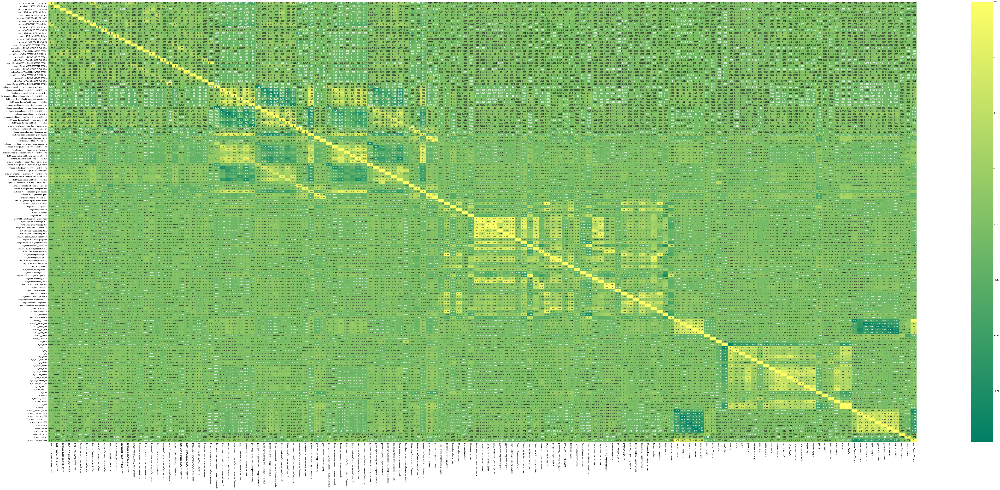

In [ ]:
# creating heatmap
plt.figure(figsize=(120,50))
sns.heatmap(df_normal[numeric_cols_normal].corr(), annot=True, cmap='summer')
plt.show()

In [ ]:
df_normal.describe(include="all")

,page_url,axe_els[AXE.INCOMPLETE_CRITICAL],axe_els[AXE.INCOMPLETE_MINOR],axe_els[AXE.INCOMPLETE_SERIOUS],axe_els[AXE.VIOLATIONS_CRITICAL],axe_els[AXE.VIOLATIONS_MINOR],axe_els[AXE.VIOLATIONS_MODERATE],axe_els[AXE.VIOLATIONS_SERIOUS],axe_err[AXE.INCOMPLETE_CRITICAL],axe_err[AXE.INCOMPLETE_MINOR],axe_err[AXE.INCOMPLETE_SERIOUS],axe_err[AXE.VIOLATIONS_CRITICAL],axe_err[AXE.VIOLATIONS_MINOR],axe_err[AXE.VIOLATIONS_MODERATE],axe_err[AXE.VIOLATIONS_SERIOUS],codesniffer_els[WCAG.OPERABLE_ERROR],codesniffer_els[WCAG.OPERABLE_WARNING],codesniffer_els[WCAG.PERCEIVABLE_ERROR],codesniffer_els[WCAG.PERCEIVABLE_WARNING],codesniffer_els[WCAG.ROBUST_ERROR],codesniffer_els[WCAG.ROBUST_WARNING],codesniffer_els[WCAG.UNDERSTANDABLE_ERROR],codesniffer_err[WCAG.OPERABLE_ERROR],codesniffer_err[WCAG.OPERABLE_WARNING],codesniffer_err[WCAG.PERCEIVABLE_ERROR],codesniffer_err[WCAG.PERCEIVABLE_WARNING],codesniffer_err[WCAG.ROBUST_ERROR],codesniffer_err[WCAG.ROBUST_WARNING],codesniffer_err[WCAG.UNDERSTANDABLE_ERROR],lighthouse_desktop[audit-score_cumulative-layout-shift],lighthouse_desktop[audit-score_first-contentful-paint],lighthouse_desktop[audit-score_interactive],lighthouse_desktop[audit-score_largest-contentful-paint],lighthouse_desktop[audit-score_max-potential-fid],lighthouse_desktop[audit-score_speed-index],lighthouse_desktop[audit-score_total-blocking-time],lighthouse_desktop[audit-val_cumulative-layout-shift],lighthouse_desktop[audit-val_first-contentful-paint],lighthouse_desktop[audit-val_interactive],lighthouse_desktop[audit-val_largest-contentful-paint],...,aim[AIM.HsvSpectrum][HSV],aim[AIM.HsvSpectrum][Hue],aim[AIM.HsvSpectrum][Saturation],aim[AIM.HsvSpectrum][Value],aim[AIM.JpgFileSize],aim[AIM.LabColours][mean A],aim[AIM.LabColours][mean B],aim[AIM.LabColours][mean Lightness],aim[AIM.LabColours][std A],aim[AIM.LabColours][std B],aim[AIM.LabColours][std Lightness],aim[AIM.Luminance],aim[AIM.PixelSymmetry],aim[AIM.PngFileSize],aim[AIM.QuadtreeDec][balance],aim[AIM.QuadtreeDec][equilibrium],aim[AIM.QuadtreeDec][leaves],aim[AIM.QuadtreeDec][symmetry],aim[AIM.StaticCc],aim[AIM.UniqueRgb],aim[AIM.Wave],aim[AIM.WhiteSpace],custom__unirank,custom__forbes_rank,custom__raex_rank,custom__qs_rank,custom__the_rank,custom__city,custom__region,custom__unirank_top300,custom__unirank_top50,custom__forbes_top100,custom__forbes_top50,custom__raex_top100,custom__raex_top50,custom__qs_top,custom__the_top,custom__city_code,custom__district,custom__unirank_group
count,524,524.000000,524.000000,524.000000,524.000000,524.000000,524.000000,524.000000,524.000000,524.000000,524.000000,524.000000,524.000000,524.000000,524.000000,524.000000,524.000000,524.000000,524.000000,524.000000,524.000000,524.000000,524.000000,524.000000,524.000000,524.000000,524.000000,524.000000,524.000000,524.000000,524.000000,524.000000,524.000000,524.000000,524.000000,524.000000,524.000000,524.000000,524.000000,524.000000,...,524.000000,524.000000,524.000000,524.000000,524.000000,524.000000,524.000000,524.000000,524.000000,524.000000,524.000000,524.000000,524.000000,5.240000e+02,524.000000,524.000000,524.000000,524.000000,524.000000,524.000000,524.000000,524.000000,524.000000,524.000000,524.000000,524.000000,524.000000,524,524.000000,524.000000,524.000000,524.000000,524.000000,524.000000,524.000000,524.000000,524.000000,524.000000,524.000000,524.000000
unique,524,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,143,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,https://www.herzen.spb.ru/,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Москва,NaN,NaN,NaN,Na

In [ ]:
def page_metrics_plots_by_okrug(df):
  resultsPage = {}
  resultsScreen = {}
  for okrug, okrugName in okruga.items():
    for pageCode in pageMetricsFull:
      df_tmp = df[df['custom__district'] == okrug]
      df_tmp[pageCode].fillna(0, inplace=True)
      mean_tmp = round(df_tmp[pageCode].mean(), 3)
      if pageCode in resultsPage:
        resultsPage[pageCode][okrug] = {'Mean': mean_tmp, 'Count': df_tmp.shape[0]}
      else:
        resultsPage[pageCode] = {okrug: {'Mean': mean_tmp, 'Count': df_tmp.shape[0]}}

  for okrug, okrugName in okruga.items():      
    for screenCode in screenMetricsFull:
      df_tmp = df[df['custom__district'] == okrug]
      df_tmp[screenCode].fillna(0, inplace=True)
      mean_tmp = round(df_tmp[screenCode].mean(), 3)
      if screenCode in resultsScreen:
        resultsScreen[screenCode][okrug] = {'Mean': mean_tmp, 'Count': df_tmp.shape[0]}
      else:
        resultsScreen[screenCode] = {okrug: {'Mean': mean_tmp, 'Count': df_tmp.shape[0]}}

  # dfScreenTable = pd.DataFrame(screenList)
  # dfScreenTable.columns = ['Metric', 'Mean', 'Std', 'Min', 'Max']
  # display(resultsPage)
  # display(resultsScreen)
  return resultsPage, resultsScreen

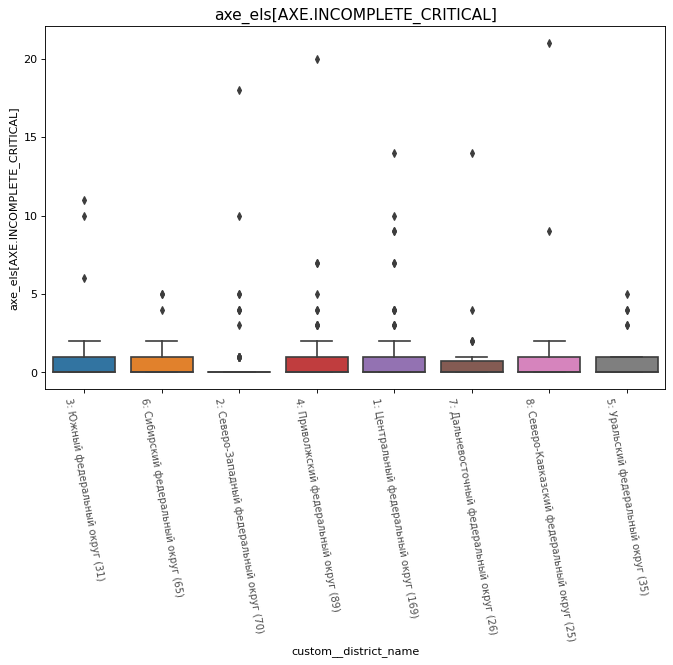

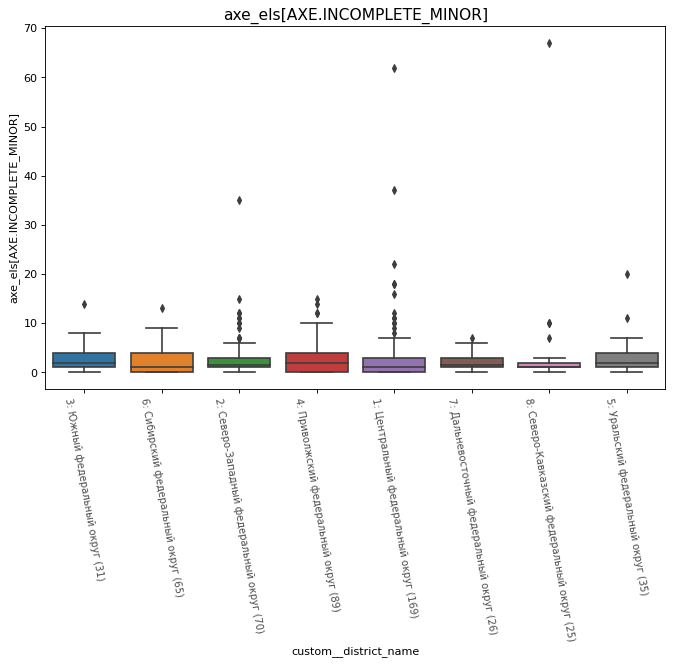

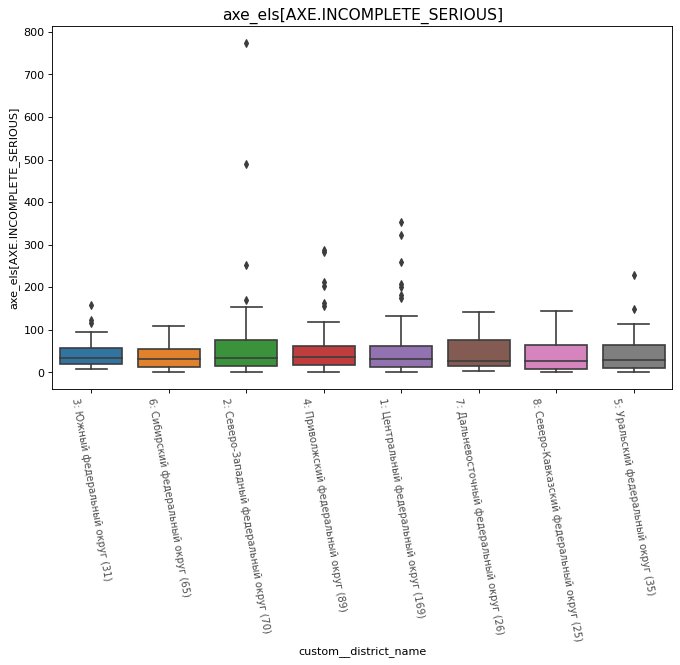

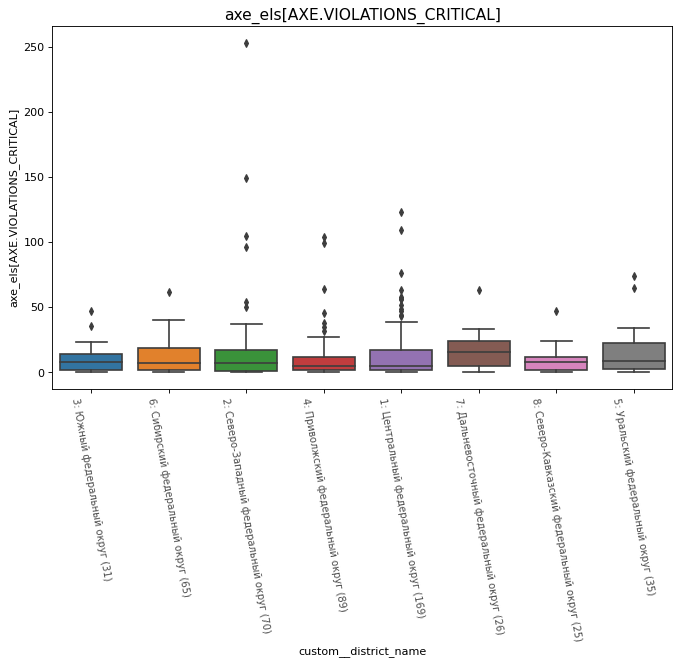

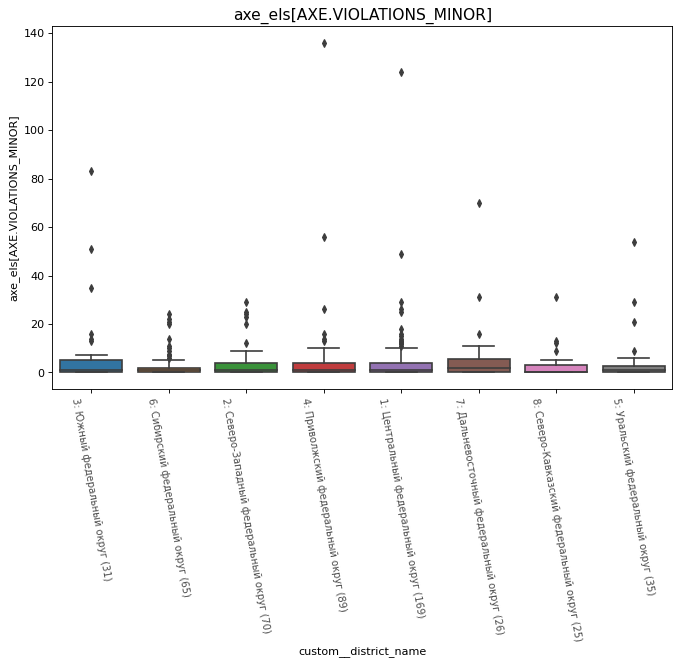

...

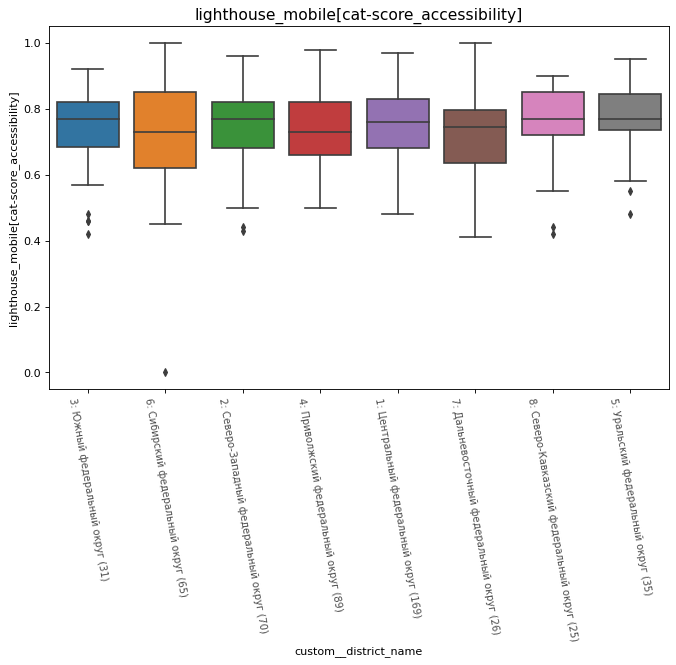

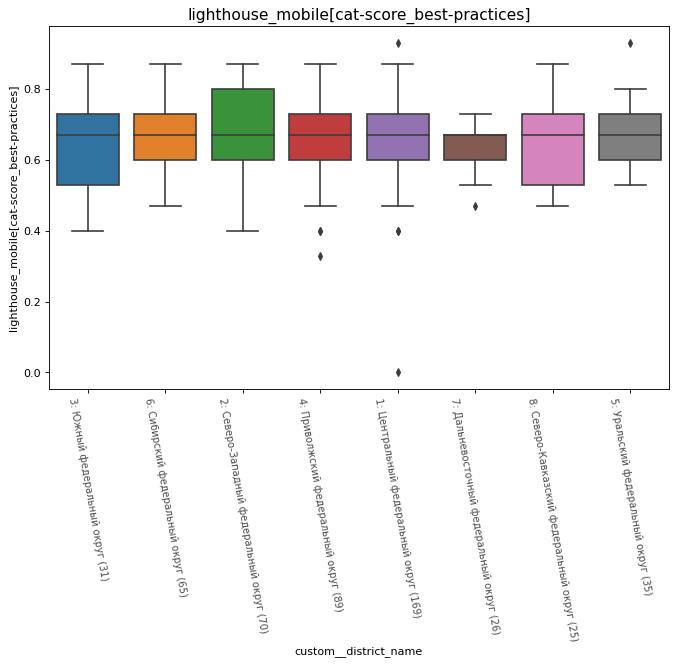

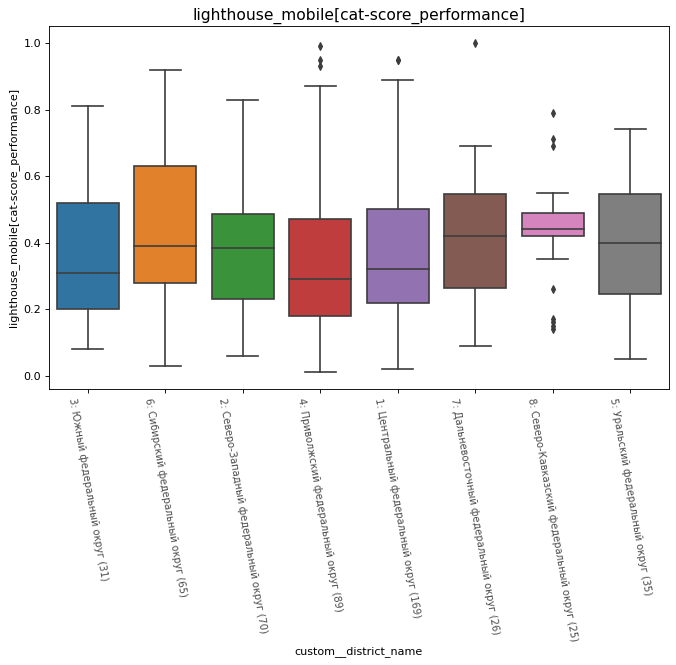

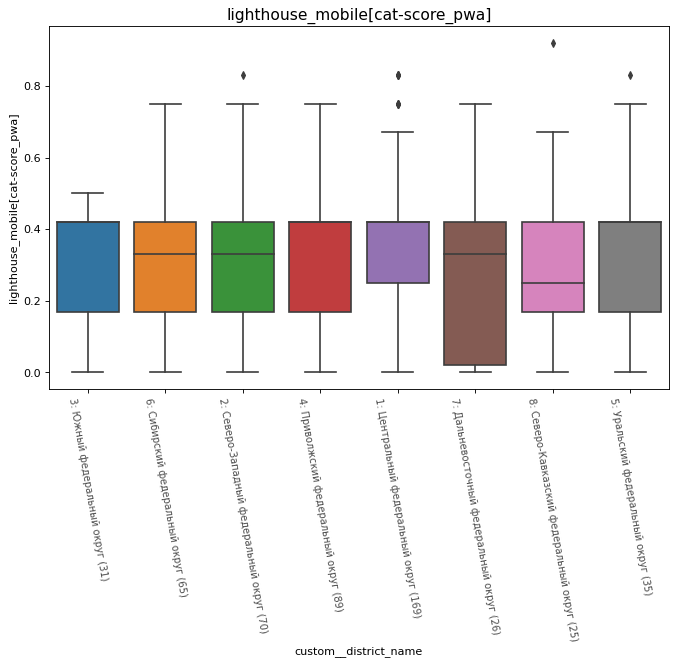

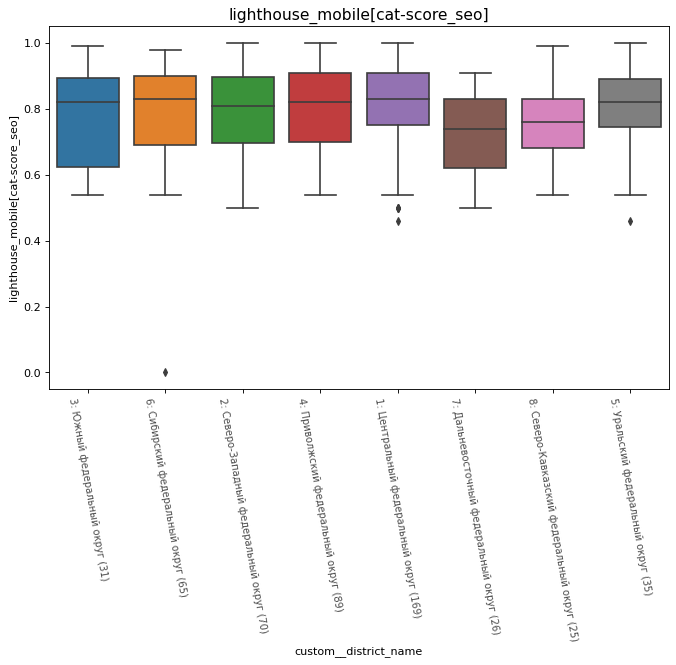

In [ ]:
for fullCode in pageMetricsFull:           
  df_tmp = df_normal.drop(df_normal[df_normal.custom__district == 0].index)
  df_tmp[fullCode].fillna(0, inplace=True)
  df_tmp['custom__district_name'] = df_tmp['custom__district'].apply(lambda x: str(x) + ": " + okruga[x] + " (" + str(df_tmp[df_tmp['custom__district'] == x].shape[0]) + ")")

  plt.figure(figsize=(10,6), dpi=80)
  sns.boxplot(x='custom__district_name', y=fullCode, data=df_tmp)

  # Decoration
  plt.title(fullCode, fontsize=14)
  plt.xticks(rotation=-80, fontsize=9, alpha=.7)
  plt.show()

In [ ]:
resultsPage, resultsScreen = page_metrics_plots_by_okrug(df_normal)             
for metric, datum in resultsPage.items():
  new = pd.DataFrame.from_dict(datum, orient='index', columns=['Mean', 'Count'])
  new['District'] = new.index
  new['District'] = new['District'].apply(lambda x: okruga[x])
  print(metric)
  display(new)
  print("")

axe_els[AXE.INCOMPLETE_CRITICAL]


,Mean,Count,District
0,0.000,1,None
1,0.817,169,Центральный федеральный округ
2,0.886,70,Северо-Западный федеральный округ
3,1.129,31,Южный федеральный округ
4,1.045,89,Приволжский федеральный округ
5,0.686,35,Уральский федеральный округ
6,0.500,64,Сибирский федеральный округ
7,1.000,26,Дальневосточный федеральный округ
8,1.560,25,Северо-Кавказский федеральный округ



axe_els[AXE.INCOMPLETE_MINOR]


,Mean,Count,District
0,0.000,1,None
1,3.142,169,Центральный федеральный округ
2,3.243,70,Северо-Западный федеральный округ
3,2.839,31,Южный федеральный округ
4,3.034,89,Приволжский федеральный округ
5,2.829,35,Уральский федеральный округ
6,2.469,64,Сибирский федеральный округ
7,2.231,26,Дальневосточный федеральный округ
8,4.720,25,Северо-Кавказский федеральный округ



axe_els[AXE.INCOMPLETE_SERIOUS]


,Mean,Count,District
0,16.000,1,None
1,47.361,169,Центральный федеральный округ
2,65.943,70,Северо-Западный федеральный округ
3,45.645,31,Южный федеральный округ
4,51.483,89,Приволжский федеральный округ
5,45.600,35,Уральский федеральный округ
6,37.703,64,Сибирский федеральный округ
7,47.731,26,Дальневосточный федеральный округ
8,43.080,25,Северо-Кавказский федеральный округ



axe_els[AXE.VIOLATIONS_CRITICAL]


,Mean,Count,District
0,5.000,1,None
1,12.976,169,Центральный федеральный округ
2,18.157,70,Северо-Западный федеральный округ
3,10.097,31,Южный федеральный округ
4,11.281,89,Приволжский федеральный округ
5,14.429,35,Уральский федеральный округ
6,11.391,64,Сибирский федеральный округ
7,16.385,26,Дальневосточный федеральный округ
8,9.200,25,Северо-Кавказский федеральный округ



axe_els[AXE.VIOLATIONS_MINOR]


,Mean,Count,District
0,11.000,1,None
1,4.160,169,Центральный федеральный округ
2,3.600,70,Северо-Западный федеральный округ
3,7.935,31,Южный федеральный округ
4,4.966,89,Приволжский федеральный округ
5,4.429,35,Уральский федеральный округ
6,3.062,64,Сибирский федеральный округ
7,6.615,26,Дальневосточный федеральный округ
8,3.200,25,Северо-Кавказский федеральный округ



axe_els[AXE.VIOLATIONS_MODERATE]


,Mean,Count,District
0,22.000,1,None
1,32.024,169,Центральный федеральный округ
2,30.714,70,Северо-Западный федеральный округ
3,25.258,31,Южный федеральный округ
4,32.652,89,Приволжский федеральный округ
5,28.514,35,Уральский федеральный округ
6,32.156,64,Сибирский федеральный округ
7,35.462,26,Дальневосточный федеральный округ
8,31.400,25,Северо-Кавказский федеральный округ



axe_els[AXE.VIOLATIONS_SERIOUS]


,Mean,Count,District
0,61.000,1,None
1,43.953,169,Центральный федеральный округ
2,39.100,70,Северо-Западный федеральный округ
3,48.742,31,Южный федеральный округ
4,40.573,89,Приволжский федеральный округ
5,39.257,35,Уральский федеральный округ
6,42.000,64,Сибирский федеральный округ
7,44.423,26,Дальневосточный федеральный округ
8,37.240,25,Северо-Кавказский федеральный округ



axe_err[AXE.INCOMPLETE_CRITICAL]


,Mean,Count,District
0,0.000,1,None
1,0.373,169,Центральный федеральный округ
2,0.257,70,Северо-Западный федеральный округ
3,0.355,31,Южный федеральный округ
4,0.517,89,Приволжский федеральный округ
5,0.343,35,Уральский федеральный округ
6,0.297,64,Сибирский федеральный округ
7,0.308,26,Дальневосточный федеральный округ
8,0.440,25,Северо-Кавказский федеральный округ



axe_err[AXE.INCOMPLETE_MINOR]


,Mean,Count,District
0,0.000,1,None
1,0.811,169,Центральный федеральный округ
2,0.786,70,Северо-Западный федеральный округ
3,0.839,31,Южный федеральный округ
4,0.764,89,Приволжский федеральный округ
5,0.829,35,Уральский федеральный округ
6,0.703,64,Сибирский федеральный округ
7,0.808,26,Дальневосточный федеральный округ
8,0.840,25,Северо-Кавказский федеральный округ



axe_err[AXE.INCOMPLETE_SERIOUS]


,Mean,Count,District
0,1.000,1,None
1,1.166,169,Центральный федеральный округ
2,1.114,70,Северо-Западный федеральный округ
3,1.129,31,Южный федеральный округ
4,1.202,89,Приволжский федеральный округ
5,1.057,35,Уральский федеральный округ
6,1.141,64,Сибирский федеральный округ
7,1.192,26,Дальневосточный федеральный округ
8,1.120,25,Северо-Кавказский федеральный округ



axe_err[AXE.VIOLATIONS_CRITICAL]


,Mean,Count,District
0,2.000,1,None
1,1.870,169,Центральный федеральный округ
2,1.614,70,Северо-Западный федеральный округ
3,1.774,31,Южный федеральный округ
4,1.708,89,Приволжский федеральный округ
5,2.057,35,Уральский федеральный округ
6,1.641,64,Сибирский федеральный округ
7,1.808,26,Дальневосточный федеральный округ
8,1.640,25,Северо-Кавказский федеральный округ



axe_err[AXE.VIOLATIONS_MINOR]


,Mean,Count,District
0,2.000,1,None
1,0.846,169,Центральный федеральный округ
2,0.886,70,Северо-Западный федеральный округ
3,0.774,31,Южный федеральный округ
4,0.854,89,Приволжский федеральный округ
5,0.886,35,Уральский федеральный округ
6,0.688,64,Сибирский федеральный округ
7,1.000,26,Дальневосточный федеральный округ
8,0.560,25,Северо-Кавказский федеральный округ



axe_err[AXE.VIOLATIONS_MODERATE]


,Mean,Count,District
0,2.000,1,None
1,3.018,169,Центральный федеральный округ
2,2.986,70,Северо-Западный федеральный округ
3,2.903,31,Южный федеральный округ
4,3.202,89,Приволжский федеральный округ
5,3.257,35,Уральский федеральный округ
6,3.234,64,Сибирский федеральный округ
7,3.538,26,Дальневосточный федеральный округ
8,3.360,25,Северо-Кавказский федеральный округ



axe_err[AXE.VIOLATIONS_SERIOUS]


,Mean,Count,District
0,4.000,1,None
1,3.243,169,Центральный федеральный округ
2,3.129,70,Северо-Западный федеральный округ
3,3.097,31,Южный федеральный округ
4,3.303,89,Приволжский федеральный округ
5,3.486,35,Уральский федеральный округ
6,3.047,64,Сибирский федеральный округ
7,3.385,26,Дальневосточный федеральный округ
8,3.240,25,Северо-Кавказский федеральный округ



codesniffer_els[WCAG.OPERABLE_ERROR]


,Mean,Count,District
0,2.000,1,None
1,1.018,169,Центральный федеральный округ
2,0.900,70,Северо-Западный федеральный округ
3,1.839,31,Южный федеральный округ
4,1.820,89,Приволжский федеральный округ
5,0.714,35,Уральский федеральный округ
6,1.391,64,Сибирский федеральный округ
7,0.577,26,Дальневосточный федеральный округ
8,1.240,25,Северо-Кавказский федеральный округ



codesniffer_els[WCAG.OPERABLE_WARNING]


,Mean,Count,District
0,1.000,1,None
1,4.260,169,Центральный федеральный округ
2,2.586,70,Северо-Западный федеральный округ
3,0.613,31,Южный федеральный округ
4,1.831,89,Приволжский федеральный округ
5,0.829,35,Уральский федеральный округ
6,3.500,64,Сибирский федеральный округ
7,1.500,26,Дальневосточный федеральный округ
8,3.560,25,Северо-Кавказский федеральный округ



codesniffer_els[WCAG.PERCEIVABLE_ERROR]


,Mean,Count,District
0,73.000,1,None
1,48.556,169,Центральный федеральный округ
2,55.529,70,Северо-Западный федеральный округ
3,63.000,31,Южный федеральный округ
4,46.989,89,Приволжский федеральный округ
5,41.086,35,Уральский федеральный округ
6,42.844,64,Сибирский федеральный округ
7,51.885,26,Дальневосточный федеральный округ
8,43.120,25,Северо-Кавказский федеральный округ



codesniffer_els[WCAG.PERCEIVABLE_WARNING]


,Mean,Count,District
0,40.000,1,None
1,92.373,169,Центральный федеральный округ
2,105.257,70,Северо-Западный федеральный округ
3,112.806,31,Южный федеральный округ
4,98.528,89,Приволжский федеральный округ
5,87.971,35,Уральский федеральный округ
6,85.812,64,Сибирский федеральный округ
7,96.769,26,Дальневосточный федеральный округ
8,87.200,25,Северо-Кавказский федеральный округ



codesniffer_els[WCAG.ROBUST_ERROR]


,Mean,Count,District
0,13.000,1,None
1,21.781,169,Центральный федеральный округ
2,19.657,70,Северо-Западный федеральный округ
3,28.710,31,Южный федеральный округ
4,19.528,89,Приволжский федеральный округ
5,17.086,35,Уральский федеральный округ
6,14.688,64,Сибирский федеральный округ
7,15.538,26,Дальневосточный федеральный округ
8,21.840,25,Северо-Кавказский федеральный округ



codesniffer_els[WCAG.ROBUST_WARNING]


,Mean,Count,District
0,26.000,1,None
1,3.172,169,Центральный федеральный округ
2,3.143,70,Северо-Западный федеральный округ
3,3.774,31,Южный федеральный округ
4,3.258,89,Приволжский федеральный округ
5,2.457,35,Уральский федеральный округ
6,3.266,64,Сибирский федеральный округ
7,4.192,26,Дальневосточный федеральный округ
8,4.040,25,Северо-Кавказский федеральный округ



codesniffer_els[WCAG.UNDERSTANDABLE_ERROR]


,Mean,Count,District
0,1.000,1,None
1,0.621,169,Центральный федеральный округ
2,0.529,70,Северо-Западный федеральный округ
3,0.774,31,Южный федеральный округ
4,0.787,89,Приволжский федеральный округ
5,0.657,35,Уральский федеральный округ
6,0.766,64,Сибирский федеральный округ
7,0.808,26,Дальневосточный федеральный округ
8,0.640,25,Северо-Кавказский федеральный округ



codesniffer_err[WCAG.OPERABLE_ERROR]


,Mean,Count,District
0,1.000,1,None
1,0.420,169,Центральный федеральный округ
2,0.457,70,Северо-Западный федеральный округ
3,0.452,31,Южный федеральный округ
4,0.562,89,Приволжский федеральный округ
5,0.429,35,Уральский федеральный округ
6,0.484,64,Сибирский федеральный округ
7,0.385,26,Дальневосточный федеральный округ
8,0.440,25,Северо-Кавказский федеральный округ



codesniffer_err[WCAG.OPERABLE_WARNING]


,Mean,Count,District
0,1.000,1,None
1,0.456,169,Центральный федеральный округ
2,0.471,70,Северо-Западный федеральный округ
3,0.258,31,Южный федеральный округ
4,0.427,89,Приволжский федеральный округ
5,0.314,35,Уральский федеральный округ
6,0.531,64,Сибирский федеральный округ
7,0.385,26,Дальневосточный федеральный округ
8,0.480,25,Северо-Кавказский федеральный округ



codesniffer_err[WCAG.PERCEIVABLE_ERROR]


,Mean,Count,District
0,4.000,1,None
1,3.686,169,Центральный федеральный округ
2,3.857,70,Северо-Западный федеральный округ
3,3.419,31,Южный федеральный округ
4,3.854,89,Приволжский федеральный округ
5,3.771,35,Уральский федеральный округ
6,3.656,64,Сибирский федеральный округ
7,4.077,26,Дальневосточный федеральный округ
8,4.080,25,Северо-Кавказский федеральный округ



codesniffer_err[WCAG.PERCEIVABLE_WARNING]


,Mean,Count,District
0,5.000,1,None
1,8.314,169,Центральный федеральный округ
2,8.300,70,Северо-Западный федеральный округ
3,9.452,31,Южный федеральный округ
4,8.404,89,Приволжский федеральный округ
5,8.143,35,Уральский федеральный округ
6,7.656,64,Сибирский федеральный округ
7,8.654,26,Дальневосточный федеральный округ
8,7.760,25,Северо-Кавказский федеральный округ



codesniffer_err[WCAG.ROBUST_ERROR]


,Mean,Count,District
0,4.000,1,None
1,3.314,169,Центральный федеральный округ
2,2.929,70,Северо-Западный федеральный округ
3,3.290,31,Южный федеральный округ
4,3.124,89,Приволжский федеральный округ
5,3.400,35,Уральский федеральный округ
6,2.953,64,Сибирский федеральный округ
7,3.077,26,Дальневосточный федеральный округ
8,2.800,25,Северо-Кавказский федеральный округ



codesniffer_err[WCAG.ROBUST_WARNING]


,Mean,Count,District
0,1.000,1,None
1,0.716,169,Центральный федеральный округ
2,0.814,70,Северо-Западный федеральный округ
3,0.774,31,Южный федеральный округ
4,0.742,89,Приволжский федеральный округ
5,0.771,35,Уральский федеральный округ
6,0.641,64,Сибирский федеральный округ
7,0.962,26,Дальневосточный федеральный округ
8,0.880,25,Северо-Кавказский федеральный округ



codesniffer_err[WCAG.UNDERSTANDABLE_ERROR]


,Mean,Count,District
0,1.000,1,None
1,0.580,169,Центральный федеральный округ
2,0.457,70,Северо-Западный федеральный округ
3,0.645,31,Южный федеральный округ
4,0.697,89,Приволжский федеральный округ
5,0.657,35,Уральский федеральный округ
6,0.719,64,Сибирский федеральный округ
7,0.769,26,Дальневосточный федеральный округ
8,0.560,25,Северо-Кавказский федеральный округ



lighthouse_desktop[audit-score_cumulative-layout-shift]


,Mean,Count,District
0,1.000,1,None
1,0.750,169,Центральный федеральный округ
2,0.738,70,Северо-Западный федеральный округ
3,0.691,31,Южный федеральный округ
4,0.682,89,Приволжский федеральный округ
5,0.739,35,Уральский федеральный округ
6,0.732,64,Сибирский федеральный округ
7,0.665,26,Дальневосточный федеральный округ
8,0.824,25,Северо-Кавказский федеральный округ



lighthouse_desktop[audit-score_first-contentful-paint]


,Mean,Count,District
0,0.520,1,None
1,0.718,169,Центральный федеральный округ
2,0.710,70,Северо-Западный федеральный округ
3,0.620,31,Южный федеральный округ
4,0.644,89,Приволжский федеральный округ
5,0.684,35,Уральский федеральный округ
6,0.758,64,Сибирский федеральный округ
7,0.610,26,Дальневосточный федеральный округ
8,0.732,25,Северо-Кавказский федеральный округ



lighthouse_desktop[audit-score_interactive]


,Mean,Count,District
0,0.930,1,None
1,0.722,169,Центральный федеральный округ
2,0.781,70,Северо-Западный федеральный округ
3,0.688,31,Южный федеральный округ
4,0.699,89,Приволжский федеральный округ
5,0.725,35,Уральский федеральный округ
6,0.816,64,Сибирский федеральный округ
7,0.720,26,Дальневосточный федеральный округ
8,0.806,25,Северо-Кавказский федеральный округ



lighthouse_desktop[audit-score_largest-contentful-paint]


,Mean,Count,District
0,0.240,1,None
1,0.440,169,Центральный федеральный округ
2,0.436,70,Северо-Западный федеральный округ
3,0.359,31,Южный федеральный округ
4,0.404,89,Приволжский федеральный округ
5,0.399,35,Уральский федеральный округ
6,0.443,64,Сибирский федеральный округ
7,0.469,26,Дальневосточный федеральный округ
8,0.523,25,Северо-Кавказский федеральный округ



lighthouse_desktop[audit-score_max-potential-fid]


,Mean,Count,District
0,0.920,1,None
1,0.844,169,Центральный федеральный округ
2,0.839,70,Северо-Западный федеральный округ
3,0.862,31,Южный федеральный округ
4,0.804,89,Приволжский федеральный округ
5,0.890,35,Уральский федеральный округ
6,0.916,64,Сибирский федеральный округ
7,0.867,26,Дальневосточный федеральный округ
8,0.884,25,Северо-Кавказский федеральный округ



lighthouse_desktop[audit-score_speed-index]


,Mean,Count,District
0,0.520,1,None
1,0.531,169,Центральный федеральный округ
2,0.534,70,Северо-Западный федеральный округ
3,0.435,31,Южный федеральный округ
4,0.449,89,Приволжский федеральный округ
5,0.481,35,Уральский федеральный округ
6,0.617,64,Сибирский федеральный округ
7,0.395,26,Дальневосточный федеральный округ
8,0.533,25,Северо-Кавказский федеральный округ



lighthouse_desktop[audit-score_total-blocking-time]


,Mean,Count,District
0,1.000,1,None
1,0.884,169,Центральный федеральный округ
2,0.900,70,Северо-Западный федеральный округ
3,0.871,31,Южный федеральный округ
4,0.817,89,Приволжский федеральный округ
5,0.903,35,Уральский федеральный округ
6,0.957,64,Сибирский федеральный округ
7,0.925,26,Дальневосточный федеральный округ
8,0.908,25,Северо-Кавказский федеральный округ



lighthouse_desktop[audit-val_cumulative-layout-shift]


,Mean,Count,District
0,0.002,1,None
1,0.158,169,Центральный федеральный округ
2,0.178,70,Северо-Западный федеральный округ
3,0.227,31,Южный федеральный округ
4,0.222,89,Приволжский федеральный округ
5,0.190,35,Уральский федеральный округ
6,0.187,64,Сибирский федеральный округ
7,0.202,26,Дальневосточный федеральный округ
8,0.155,25,Северо-Кавказский федеральный округ



lighthouse_desktop[audit-val_first-contentful-paint]


,Mean,Count,District
0,1563.544,1,None
1,1280.666,169,Центральный федеральный округ
2,1271.776,70,Северо-Западный федеральный округ
3,1603.602,31,Южный федеральный округ
4,1455.435,89,Приволжский федеральный округ
5,1362.744,35,Уральский федеральный округ
6,1157.408,64,Сибирский федеральный округ
7,1629.612,26,Дальневосточный федеральный округ
8,1186.077,25,Северо-Кавказский федеральный округ



lighthouse_desktop[audit-val_interactive]


,Mean,Count,District
0,2265.282,1,None
1,3330.783,169,Центральный федеральный округ
2,2820.856,70,Северо-Западный федеральный округ
3,3470.514,31,Южный федеральный округ
4,3460.111,89,Приволжский федеральный округ
5,3351.956,35,Уральский федеральный округ
6,2657.241,64,Сибирский федеральный округ
7,3308.102,26,Дальневосточный федеральный округ
8,2814.884,25,Северо-Кавказский федеральный округ



lighthouse_desktop[audit-val_largest-contentful-paint]


,Mean,Count,District
0,3499.877,1,None
1,3482.179,169,Центральный федеральный округ
2,3200.164,70,Северо-Западный федеральный округ
3,3741.195,31,Южный федеральный округ
4,3720.780,89,Приволжский федеральный округ
5,3590.619,35,Уральский федеральный округ
6,3382.943,64,Сибирский федеральный округ
7,3463.722,26,Дальневосточный федеральный округ
8,2680.431,25,Северо-Кавказский федеральный округ



lighthouse_desktop[audit-val_max-potential-fid]


,Mean,Count,District
0,121.000,1,None
1,135.456,169,Центральный федеральный округ
2,171.036,70,Северо-Западный федеральный округ
3,119.903,31,Южный федеральный округ
4,146.483,89,Приволжский федеральный округ
5,112.043,35,Уральский федеральный округ
6,101.266,64,Сибирский федеральный округ
7,127.462,26,Дальневосточный федеральный округ
8,110.900,25,Северо-Кавказский федеральный округ



lighthouse_desktop[audit-val_speed-index]


,Mean,Count,District
0,2249.314,1,None
1,2545.421,169,Центральный федеральный округ
2,2420.665,70,Северо-Западный федеральный округ
3,3006.187,31,Южный федеральный округ
4,3189.757,89,Приволжский федеральный округ
5,2688.684,35,Уральский федеральный округ
6,2150.517,64,Сибирский федеральный округ
7,3269.650,26,Дальневосточный федеральный округ
8,2529.606,25,Северо-Кавказский федеральный округ



lighthouse_desktop[audit-val_total-blocking-time]


,Mean,Count,District
0,40.000,1,None
1,123.460,169,Центральный федеральный округ
2,170.879,70,Северо-Западный федеральный округ
3,165.150,31,Южный федеральный округ
4,195.600,89,Приволжский федеральный округ
5,149.540,35,Уральский федеральный округ
6,62.029,64,Сибирский федеральный округ
7,96.959,26,Дальневосточный федеральный округ
8,161.216,25,Северо-Кавказский федеральный округ



lighthouse_desktop[cat-score_accessibility]


,Mean,Count,District
0,0.650,1,None
1,0.740,169,Центральный федеральный округ
2,0.746,70,Северо-Западный федеральный округ
3,0.729,31,Южный федеральный округ
4,0.729,89,Приволжский федеральный округ
5,0.743,35,Уральский федеральный округ
6,0.715,64,Сибирский федеральный округ
7,0.693,26,Дальневосточный федеральный округ
8,0.747,25,Северо-Кавказский федеральный округ



lighthouse_desktop[cat-score_best-practices]


,Mean,Count,District
0,0.670,1,None
1,0.708,169,Центральный федеральный округ
2,0.713,70,Северо-Западный федеральный округ
3,0.675,31,Южный федеральный округ
4,0.694,89,Приволжский федеральный округ
5,0.718,35,Уральский федеральный округ
6,0.711,64,Сибирский федеральный округ
7,0.677,26,Дальневосточный федеральный округ
8,0.690,25,Северо-Кавказский федеральный округ



lighthouse_desktop[cat-score_performance]


,Mean,Count,District
0,0.710,1,None
1,0.685,169,Центральный федеральный округ
2,0.693,70,Северо-Западный федеральный округ
3,0.629,31,Южный федеральный округ
4,0.628,89,Приволжский федеральный округ
5,0.670,35,Уральский федеральный округ
6,0.727,64,Сибирский федеральный округ
7,0.667,26,Дальневосточный федеральный округ
8,0.734,25,Северо-Кавказский федеральный округ



lighthouse_desktop[cat-score_pwa]


,Mean,Count,District
0,0.000,1,None
1,0.322,169,Центральный федеральный округ
2,0.323,70,Северо-Западный федеральный округ
3,0.273,31,Южный федеральный округ
4,0.291,89,Приволжский федеральный округ
5,0.320,35,Уральский федеральный округ
6,0.306,64,Сибирский федеральный округ
7,0.239,26,Дальневосточный федеральный округ
8,0.256,25,Северо-Кавказский федеральный округ



lighthouse_desktop[cat-score_seo]


,Mean,Count,District
0,0.730,1,None
1,0.821,169,Центральный федеральный округ
2,0.820,70,Северо-Западный федеральный округ
3,0.804,31,Южный федеральный округ
4,0.821,89,Приволжский федеральный округ
5,0.797,35,Уральский федеральный округ
6,0.812,64,Сибирский федеральный округ
7,0.774,26,Дальневосточный федеральный округ
8,0.789,25,Северо-Кавказский федеральный округ



lighthouse_mobile[audit-score_cumulative-layout-shift]


,Mean,Count,District
0,0.980,1,None
1,0.768,169,Центральный федеральный округ
2,0.676,70,Северо-Западный федеральный округ
3,0.694,31,Южный федеральный округ
4,0.697,89,Приволжский федеральный округ
5,0.775,35,Уральский федеральный округ
6,0.678,64,Сибирский федеральный округ
7,0.669,26,Дальневосточный федеральный округ
8,0.774,25,Северо-Кавказский федеральный округ



lighthouse_mobile[audit-score_first-contentful-paint]


,Mean,Count,District
0,0.190,1,None
1,0.382,169,Центральный федеральный округ
2,0.415,70,Северо-Западный федеральный округ
3,0.362,31,Южный федеральный округ
4,0.347,89,Приволжский федеральный округ
5,0.367,35,Уральский федеральный округ
6,0.382,64,Сибирский федеральный округ
7,0.367,26,Дальневосточный федеральный округ
8,0.382,25,Северо-Кавказский федеральный округ



lighthouse_mobile[audit-score_interactive]


,Mean,Count,District
0,0.420,1,None
1,0.278,169,Центральный федеральный округ
2,0.306,70,Северо-Западный федеральный округ
3,0.256,31,Южный федеральный округ
4,0.258,89,Приволжский федеральный округ
5,0.252,35,Уральский федеральный округ
6,0.338,64,Сибирский федеральный округ
7,0.308,26,Дальневосточный федеральный округ
8,0.282,25,Северо-Кавказский федеральный округ



lighthouse_mobile[audit-score_largest-contentful-paint]


,Mean,Count,District
0,0.000,1,None
1,0.143,169,Центральный федеральный округ
2,0.112,70,Северо-Западный федеральный округ
3,0.150,31,Южный федеральный округ
4,0.117,89,Приволжский федеральный округ
5,0.150,35,Уральский федеральный округ
6,0.217,64,Сибирский федеральный округ
7,0.223,26,Дальневосточный федеральный округ
8,0.154,25,Северо-Кавказский федеральный округ



lighthouse_mobile[audit-score_max-potential-fid]


,Mean,Count,District
0,0.180,1,None
1,0.240,169,Центральный федеральный округ
2,0.257,70,Северо-Западный федеральный округ
3,0.280,31,Южный федеральный округ
4,0.284,89,Приволжский федеральный округ
5,0.320,35,Уральский федеральный округ
6,0.349,64,Сибирский федеральный округ
7,0.355,26,Дальневосточный федеральный округ
8,0.303,25,Северо-Кавказский федеральный округ



lighthouse_mobile[audit-score_speed-index]


,Mean,Count,District
0,0.350,1,None
1,0.375,169,Центральный федеральный округ
2,0.379,70,Северо-Западный федеральный округ
3,0.327,31,Южный федеральный округ
4,0.307,89,Приволжский федеральный округ
5,0.341,35,Уральский федеральный округ
6,0.433,64,Сибирский федеральный округ
7,0.312,26,Дальневосточный федеральный округ
8,0.394,25,Северо-Кавказский федеральный округ



lighthouse_mobile[audit-score_total-blocking-time]


,Mean,Count,District
0,0.420,1,None
1,0.396,169,Центральный федеральный округ
2,0.444,70,Северо-Западный федеральный округ
3,0.431,31,Южный федеральный округ
4,0.426,89,Приволжский федеральный округ
5,0.496,35,Уральский федеральный округ
6,0.583,64,Сибирский федеральный округ
7,0.547,26,Дальневосточный федеральный округ
8,0.566,25,Северо-Кавказский федеральный округ



lighthouse_mobile[audit-val_cumulative-layout-shift]


,Mean,Count,District
0,0.061,1,None
1,0.157,169,Центральный федеральный округ
2,0.222,70,Северо-Западный федеральный округ
3,0.216,31,Южный федеральный округ
4,0.213,89,Приволжский федеральный округ
5,0.261,35,Уральский федеральный округ
6,0.256,64,Сибирский федеральный округ
7,0.218,26,Дальневосточный федеральный округ
8,0.211,25,Северо-Кавказский федеральный округ



lighthouse_mobile[audit-val_first-contentful-paint]


,Mean,Count,District
0,4282.042,1,None
1,4003.175,169,Центральный федеральный округ
2,4212.203,70,Северо-Западный федеральный округ
3,4737.022,31,Южный федеральный округ
4,4716.081,89,Приволжский федеральный округ
5,4179.124,35,Уральский федеральный округ
6,3997.247,64,Сибирский федеральный округ
7,4541.915,26,Дальневосточный федеральный округ
8,3838.651,25,Северо-Кавказский федеральный округ



lighthouse_mobile[audit-val_interactive]


,Mean,Count,District
0,8145.992,1,None
1,14924.437,169,Центральный федеральный округ
2,12625.856,70,Северо-Западный федеральный округ
3,19113.573,31,Южный федеральный округ
4,15944.501,89,Приволжский федеральный округ
5,15916.519,35,Уральский федеральный округ
6,14118.944,64,Сибирский федеральный округ
7,12578.301,26,Дальневосточный федеральный округ
8,13125.887,25,Северо-Кавказский федеральный округ



lighthouse_mobile[audit-val_largest-contentful-paint]


,Mean,Count,District
0,24501.181,1,None
1,14315.748,169,Центральный федеральный округ
2,12029.296,70,Северо-Западный федеральный округ
3,12006.438,31,Южный федеральный округ
4,13858.745,89,Приволжский федеральный округ
5,10281.638,35,Уральский федеральный округ
6,10973.772,64,Сибирский федеральный округ
7,9051.014,26,Дальневосточный федеральный округ
8,10339.353,25,Северо-Кавказский федеральный округ



lighthouse_mobile[audit-val_max-potential-fid]


,Mean,Count,District
0,401.000,1,None
1,576.550,169,Центральный федеральный округ
2,707.964,70,Северо-Западный федеральный округ
3,522.032,31,Южный федеральный округ
4,554.056,89,Приволжский федеральный округ
5,464.886,35,Уральский федеральный округ
6,427.023,64,Сибирский федеральный округ
7,455.038,26,Дальневосточный федеральный округ
8,491.780,25,Северо-Кавказский федеральный округ



lighthouse_mobile[audit-val_speed-index]


,Mean,Count,District
0,6843.674,1,None
1,8496.457,169,Центральный федеральный округ
2,8142.811,70,Северо-Западный федеральный округ
3,9630.605,31,Южный федеральный округ
4,9806.258,89,Приволжский федеральный округ
5,8775.396,35,Уральский федеральный округ
6,7053.031,64,Сибирский федеральный округ
7,8664.796,26,Дальневосточный федеральный округ
8,7976.490,25,Северо-Кавказский федеральный округ



lighthouse_mobile[audit-val_total-blocking-time]


,Mean,Count,District
0,706.000,1,None
1,1312.096,169,Центральный федеральный округ
2,1269.976,70,Северо-Западный федеральный округ
3,1584.677,31,Южный федеральный округ
4,1758.936,89,Приволжский федеральный округ
5,1903.164,35,Уральский федеральный округ
6,2691.410,64,Сибирский федеральный округ
7,723.761,26,Дальневосточный федеральный округ
8,1527.053,25,Северо-Кавказский федеральный округ



lighthouse_mobile[cat-score_accessibility]


,Mean,Count,District
0,0.650,1,None
1,0.751,169,Центральный федеральный округ
2,0.740,70,Северо-Западный федеральный округ
3,0.731,31,Южный федеральный округ
4,0.737,89,Приволжский федеральный округ
5,0.767,35,Уральский федеральный округ
6,0.725,64,Сибирский федеральный округ
7,0.712,26,Дальневосточный федеральный округ
8,0.750,25,Северо-Кавказский федеральный округ



lighthouse_mobile[cat-score_best-practices]


,Mean,Count,District
0,0.600,1,None
1,0.670,169,Центральный федеральный округ
2,0.673,70,Северо-Западный федеральный округ
3,0.641,31,Южный федеральный округ
4,0.658,89,Приволжский федеральный округ
5,0.679,35,Уральский федеральный округ
6,0.666,64,Сибирский федеральный округ
7,0.632,26,Дальневосточный федеральный округ
8,0.653,25,Северо-Кавказский федеральный округ



lighthouse_mobile[cat-score_performance]


,Mean,Count,District
0,0.370,1,None
1,0.373,169,Центральный федеральный округ
2,0.373,70,Северо-Западный федеральный округ
3,0.365,31,Южный федеральный округ
4,0.353,89,Приволжский федеральный округ
5,0.398,35,Уральский федеральный округ
6,0.447,64,Сибирский федеральный округ
7,0.418,26,Дальневосточный федеральный округ
8,0.430,25,Северо-Кавказский федеральный округ



lighthouse_mobile[cat-score_pwa]


,Mean,Count,District
0,0.000,1,None
1,0.350,169,Центральный федеральный округ
2,0.342,70,Северо-Западный федеральный округ
3,0.311,31,Южный федеральный округ
4,0.320,89,Приволжский федеральный округ
5,0.352,35,Уральский федеральный округ
6,0.333,64,Сибирский федеральный округ
7,0.257,26,Дальневосточный федеральный округ
8,0.282,25,Северо-Кавказский федеральный округ



lighthouse_mobile[cat-score_seo]


,Mean,Count,District
0,0.620,1,None
1,0.808,169,Центральный федеральный округ
2,0.794,70,Северо-Западный федеральный округ
3,0.776,31,Южный федеральный округ
4,0.799,89,Приволжский федеральный округ
5,0.789,35,Уральский федеральный округ
6,0.780,64,Сибирский федеральный округ
7,0.732,26,Дальневосточный федеральный округ
8,0.756,25,Северо-Кавказский федеральный округ


In [ ]:
df_normal.head(2)

,page_url,axe_els[AXE.INCOMPLETE_CRITICAL],axe_els[AXE.INCOMPLETE_MINOR],axe_els[AXE.INCOMPLETE_SERIOUS],axe_els[AXE.VIOLATIONS_CRITICAL],axe_els[AXE.VIOLATIONS_MINOR],axe_els[AXE.VIOLATIONS_MODERATE],axe_els[AXE.VIOLATIONS_SERIOUS],axe_err[AXE.INCOMPLETE_CRITICAL],axe_err[AXE.INCOMPLETE_MINOR],axe_err[AXE.INCOMPLETE_SERIOUS],axe_err[AXE.VIOLATIONS_CRITICAL],axe_err[AXE.VIOLATIONS_MINOR],axe_err[AXE.VIOLATIONS_MODERATE],axe_err[AXE.VIOLATIONS_SERIOUS],codesniffer_els[WCAG.OPERABLE_ERROR],codesniffer_els[WCAG.OPERABLE_WARNING],codesniffer_els[WCAG.PERCEIVABLE_ERROR],codesniffer_els[WCAG.PERCEIVABLE_WARNING],codesniffer_els[WCAG.PREDICTABLE_ERROR],codesniffer_els[WCAG.PREDICTABLE_WARNING],codesniffer_els[WCAG.UNDERSTANDABLE_ERROR],codesniffer_err[WCAG.OPERABLE_ERROR],codesniffer_err[WCAG.OPERABLE_WARNING],codesniffer_err[WCAG.PERCEIVABLE_ERROR],codesniffer_err[WCAG.PERCEIVABLE_WARNING],codesniffer_err[WCAG.PREDICTABLE_ERROR],codesniffer_err[WCAG.PREDICTABLE_WARNING],codesniffer_err[WCAG.UNDERSTANDABLE_ERROR],lighthouse_desktop[audit-score_cumulative-layout-shift],lighthouse_desktop[audit-score_first-contentful-paint],lighthouse_desktop[audit-score_interactive],lighthouse_desktop[audit-score_largest-contentful-paint],lighthouse_desktop[audit-score_max-potential-fid],lighthouse_desktop[audit-score_speed-index],lighthouse_desktop[audit-score_total-blocking-time],lighthouse_desktop[audit-val_cumulative-layout-shift],lighthouse_desktop[audit-val_first-contentful-paint],lighthouse_desktop[audit-val_interactive],lighthouse_desktop[audit-val_largest-contentful-paint],...,aim[AIM.HsvSpectrum][HSV],aim[AIM.HsvSpectrum][Hue],aim[AIM.HsvSpectrum][Saturation],aim[AIM.HsvSpectrum][Value],aim[AIM.JpgFileSize],aim[AIM.LabColours][mean A],aim[AIM.LabColours][mean B],aim[AIM.LabColours][mean Lightness],aim[AIM.LabColours][std A],aim[AIM.LabColours][std B],aim[AIM.LabColours][std Lightness],aim[AIM.Luminance],aim[AIM.PixelSymmetry],aim[AIM.PngFileSize],aim[AIM.QuadtreeDec][balance],aim[AIM.QuadtreeDec][equilibrium],aim[AIM.QuadtreeDec][leaves],aim[AIM.QuadtreeDec][symmetry],aim[AIM.StaticCc],aim[AIM.UniqueRgb],aim[AIM.Wave],aim[AIM.WhiteSpace],custom__unirank,custom__forbes_rank,custom__raex_rank,custom__qs_rank,custom__the_rank,custom__city,custom__region,custom__unirank_top300,custom__unirank_top50,custom__forbes_top100,custom__forbes_top50,custom__raex_top100,custom__raex_top50,custom__qs_top,custom__the_top,custom__city_code,custom__district,custom__unirank_group
0,https://www.adygnet.ru/,2.0,3.0,123.0,1.0,1.0,5.0,16.0,2.0,1.0,1.0,1.0,1.0,3.0,1.0,1.0,0.0,74.0,155.0,43.0,12.0,0.0,1.0,0.0,4.0,9.0,2.0,1.0,0.0,0.01,0.91,0.74,0.02,0.92,0.11,0.91,1.440895,906.1105,3322.5355,6962.480,...,15100,26127,16835,256,169566,8.607802,-27.677990,60.432917,30.758022,28.055407,31.066950,82.371337,0.528860,414030,0.851173,0.999787,2647,0.568012,3923,6461,0.70530,0.121287,274.0,200.0,200.0,50.0,12.0,Майкоп,1,1,0,0,0,0,0,0,0,56,3,3
1,https://www.altstu.ru/,0.0,0.0,80.0,7.0,0.0,25.0,24.0,0.0,0.0,1.0,1.0,0.0,4.0,3.0,11.0,0.0,22.0,89.0,0.0,10.0,0.0,1.0,0.0,3.0,8.0,0.0,1.0,0.0,1.00,1.00,1.00,0.65,1.00,1.00,1.00,0.038132,510.1990,530.1990,1953.199,...,9156,21577,20074,256,144327,-1.416603,0.622743,85.612797,11.496676,11.664596,25.959719,70.122659,0.619102,550278,0.682185,0.999722,2020,0.624323,4566,8998,0.50122,0.650790,131.0,200.0,100.0,50.0,12.0,Барнаул,22,1,0,0,0,1,0,0,0,5,6,2


In [ ]:
# "custom__forbes_top100", "custom__forbes_top50", "custom__raex_top100", "custom__raex_top50", "custom__qs_top", "custom__the_top"

df_normal.groupby(['custom__district', 'custom__raex_top100'])['page_url'].agg(['count'])

count
custom__district custom__raex_top100       
0                0                        1
1                0                      129
                 1                       40
2                0                       56
                 1                       14
3                0                       26
                 1                        5
4                0                       77
                 1                       12
5                0                       29
                 1                        6
6                0                       56
                 1                        9
7                0                       23
                 1                        3
8                0                       22
                 1                        3

In [ ]:
withoutLighthouse = list(filter(lambda s: 'lighthouse_' not in s, pageMetricsFull))

withoutLighthouseEls = list(filter(lambda s: '_els[' in s, withoutLighthouse))
withoutLighthouseErr = list(filter(lambda s: '_err[' in s, withoutLighthouse))
display(withoutLighthouseEls)
display(withoutLighthouseErr)

['axe_els[AXE.INCOMPLETE_CRITICAL]',
 'axe_els[AXE.INCOMPLETE_MINOR]',
 'axe_els[AXE.INCOMPLETE_SERIOUS]',
 'axe_els[AXE.VIOLATIONS_CRITICAL]',
 'axe_els[AXE.VIOLATIONS_MINOR]',
 'axe_els[AXE.VIOLATIONS_MODERATE]',
 'axe_els[AXE.VIOLATIONS_SERIOUS]',
 'codesniffer_els[WCAG.OPERABLE_ERROR]',
 'codesniffer_els[WCAG.OPERABLE_WARNING]',
 'codesniffer_els[WCAG.PERCEIVABLE_ERROR]',
 'codesniffer_els[WCAG.PERCEIVABLE_WARNING]',
 'codesniffer_els[WCAG.ROBUST_ERROR]',
 'codesniffer_els[WCAG.ROBUST_WARNING]',
 'codesniffer_els[WCAG.UNDERSTANDABLE_ERROR]']

['axe_err[AXE.INCOMPLETE_CRITICAL]',
 'axe_err[AXE.INCOMPLETE_MINOR]',
 'axe_err[AXE.INCOMPLETE_SERIOUS]',
 'axe_err[AXE.VIOLATIONS_CRITICAL]',
 'axe_err[AXE.VIOLATIONS_MINOR]',
 'axe_err[AXE.VIOLATIONS_MODERATE]',
 'axe_err[AXE.VIOLATIONS_SERIOUS]',
 'codesniffer_err[WCAG.OPERABLE_ERROR]',
 'codesniffer_err[WCAG.OPERABLE_WARNING]',
 'codesniffer_err[WCAG.PERCEIVABLE_ERROR]',
 'codesniffer_err[WCAG.PERCEIVABLE_WARNING]',
 'codesniffer_err[WCAG.ROBUST_ERROR]',
 'codesniffer_err[WCAG.ROBUST_WARNING]',
 'codesniffer_err[WCAG.UNDERSTANDABLE_ERROR]']

In [ ]:
# Далее будем считать среднее по метрикам. Выбираем столбец для группировки результатов

# compare_group_by = 'custom__district'
compare_group_by = 'custom__category'

tmp = withoutLighthouseEls + [compare_group_by]
# print(tmp)

df_normal_stat_els = df_normal.filter(regex='^(?!lighthouse_)', axis=1)
df_normal_stat_els = df_normal_stat_els.filter(regex='^.*(?!_els|custom_)', axis=1)
df_normal_stat_els = df_normal_stat_els[tmp].groupby([compare_group_by], as_index=False).mean()
df_normal_stat_els

,custom__category,axe_els[AXE.INCOMPLETE_CRITICAL],axe_els[AXE.INCOMPLETE_MINOR],axe_els[AXE.INCOMPLETE_SERIOUS],axe_els[AXE.VIOLATIONS_CRITICAL],axe_els[AXE.VIOLATIONS_MINOR],axe_els[AXE.VIOLATIONS_MODERATE],axe_els[AXE.VIOLATIONS_SERIOUS],codesniffer_els[WCAG.OPERABLE_ERROR],codesniffer_els[WCAG.OPERABLE_WARNING],codesniffer_els[WCAG.PERCEIVABLE_ERROR],codesniffer_els[WCAG.PERCEIVABLE_WARNING],codesniffer_els[WCAG.ROBUST_ERROR],codesniffer_els[WCAG.ROBUST_WARNING],codesniffer_els[WCAG.UNDERSTANDABLE_ERROR]
0,0,0.615385,4.435897,37.512821,12.282051,2.717949,24.538462,30.102564,1.512821,1.435897,35.769231,89.564103,12.000000,3.974359,0.794872
1,1,0.692308,3.769231,31.846154,12.307692,5.615385,22.769231,36.384615,0.461538,7.461538,42.538462,72.461538,17.230769,0.769231,0.923077
2,2,1.250000,6.166667,40.000000,21.583333,4.166667,36.500000,38.833333,1.250000,1.250000,43.666667,80.666667,19.416667,3.583333,0.583333
3,3,0.709677,3.096774,49.782258,13.943548,4.846774,32.040323,45.580645,1.145161,2.346774,52.250000,101.693548,21.298387,3.911290,0.620968
4,4,0.622951,2.868852,45.836066,12.622951,4.081967,27.573770,36.032787,1.081967,3.442623,46.065574,88.950820,14.065574,3.590164,0.721311
5,5,0.911111,2.377778,47.977778,14.644444,5.644444,36.422222,40.777778,1.866667,5.133333,45.288889,100.866667,31.333333,1.333333,0.822222
6,6,0.945055,2.857143,43.835165,12.868132,4.846154,31.824176,50.340659,1.329670,2.494505,56.395604,90.868132,20.637363,4.197802,0.736264
7,7,2.000000,2.392857,51.250000,11.107143,4.607143,44.857143,44.571429,1.750000,1.214286,48.071429,104.107143,26.178571,5.464286,0.500000
8,8,0.500000,1.500000,57.500000,3.000000,0.000000,13.500000,39.000000,0.500000,0.500000,138.500000,77.000000,9.000000,2.000000,0.000000
9,9,0.954545,2.833333,71.636364,12.848485,3.954545,26.984848,37.378788,0.696970,3.075758,44.181818,99.954545,18.500000,1.818182,0.530303


In [ ]:
tmp = withoutLighthouseErr + [compare_group_by]
# print(tmp)

df_normal_stat_err = df_normal.filter(regex='^(?!lighthouse_)', axis=1)
df_normal_stat_err = df_normal_stat_err.filter(regex='^.*(?!_els|custom_)', axis=1)
df_normal_stat_err = df_normal_stat_err[tmp].groupby([compare_group_by], as_index=False).mean()
df_normal_stat_err

,custom__category,axe_err[AXE.INCOMPLETE_CRITICAL],axe_err[AXE.INCOMPLETE_MINOR],axe_err[AXE.INCOMPLETE_SERIOUS],axe_err[AXE.VIOLATIONS_CRITICAL],axe_err[AXE.VIOLATIONS_MINOR],axe_err[AXE.VIOLATIONS_MODERATE],axe_err[AXE.VIOLATIONS_SERIOUS],codesniffer_err[WCAG.OPERABLE_ERROR],codesniffer_err[WCAG.OPERABLE_WARNING],codesniffer_err[WCAG.PERCEIVABLE_ERROR],codesniffer_err[WCAG.PERCEIVABLE_WARNING],codesniffer_err[WCAG.ROBUST_ERROR],codesniffer_err[WCAG.ROBUST_WARNING],codesniffer_err[WCAG.UNDERSTANDABLE_ERROR]
0,0,0.410256,0.641026,1.179487,1.717949,0.717949,2.974359,3.205128,0.666667,0.410256,3.717949,7.538462,3.025641,0.846154,0.794872
1,1,0.307692,1.076923,1.153846,1.461538,0.692308,2.769231,2.923077,0.230769,0.769231,3.307692,7.153846,2.923077,0.538462,0.615385
2,2,0.333333,0.666667,1.416667,1.666667,0.833333,2.666667,2.166667,0.416667,0.500000,3.500000,7.500000,2.500000,0.166667,0.583333
3,3,0.362903,0.870968,1.104839,1.854839,0.951613,3.137097,3.282258,0.467742,0.419355,3.919355,8.693548,3.717742,0.814516,0.580645
4,4,0.393443,0.754098,1.163934,1.622951,0.819672,3.163934,3.196721,0.360656,0.524590,3.442623,7.918033,2.557377,0.803279,0.655738
5,5,0.533333,0.711111,1.244444,1.711111,0.822222,3.311111,3.644444,0.666667,0.577778,3.777778,8.666667,2.955556,0.600000,0.733333
6,6,0.318681,0.835165,1.131868,1.780220,0.780220,3.285714,3.373626,0.472527,0.395604,3.868132,8.450549,3.362637,0.802198,0.670330
7,7,0.428571,0.642857,1.071429,1.964286,0.964286,2.964286,3.321429,0.535714,0.178571,3.750000,8.107143,2.892857,1.071429,0.500000
8,8,0.500000,0.500000,1.000000,2.000000,0.000000,2.000000,2.500000,0.500000,0.500000,3.000000,6.500000,3.000000,1.000000,0.000000
9,9,0.318182,0.727273,1.136364,1.939394,0.757576,3.106061,2.924242,0.363636,0.393939,3.803030,8.409091,3.166667,0.681818,0.484848


In [ ]:
summ_by_district_els = {}
for idx, row in df_normal_stat_els.iterrows():
  summ = 0
  for pm in withoutLighthouseEls:
      tmp = row[pm]
      summ += row[pm]
  df_normal_stat_els.loc[idx, 'summ_by_district_els'] = summ
  

df_normal_stat_els_final = df_normal_stat_els.filter(regex='^(custom_|summ_)', axis=1)
if (compare_group_by == 'custom__district'):
  df_normal_stat_els_final['custom__district_name'] = df_normal_stat_els_final['custom__district'].apply(lambda x: okruga[x])

display(df_normal_stat_els_final.sort_values(by='summ_by_district_els', ascending=False))

,custom__category,summ_by_district_els
7,7,348.071429
8,8,342.500000
5,5,335.400000
3,3,333.266129
10,10,325.357143
9,9,325.348485
6,6,324.175824
2,2,298.916667
11,11,288.933333
4,4,287.557377


In [ ]:
summ_by_district_err = {}
for idx, row in df_normal_stat_err.iterrows():
  summ = 0
  for pm in withoutLighthouseErr:
      tmp = row[pm]
      summ += row[pm]
  df_normal_stat_err.loc[idx, 'summ_by_district_err'] = summ

df_normal_stat_err_final = df_normal_stat_err.filter(regex='^(custom_|summ_)', axis=1)
if (compare_group_by == 'custom__district'):
  df_normal_stat_err_final['custom__district_name'] = df_normal_stat_err_final['custom__district'].apply(lambda x: okruga[x])

display(df_normal_stat_err_final.sort_values(by='summ_by_district_err', ascending=False))

,custom__category,summ_by_district_err
3,3,30.177419
5,5,29.955556
6,6,29.527473
7,7,28.392857
11,11,28.333333
9,9,28.212121
0,0,27.846154
4,4,27.377049
1,1,25.923077
10,10,25.500000
